In [1]:
import numpy as np
import pandas as pd

import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()
import plotly.io as pio
pio.templates.default = "plotly_white"
pd.options.plotting.backend = "plotly"
#extra imports out of curiosity
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

Conda Environment practice to make it a habit

In [ ]:
conda info


     active environment : base
    active env location : C:\Users\donna\anaconda3
            shell level : 1
       user config file : C:\Users\donna\.condarc
 populated config files : C:\Users\donna\.condarc
          conda version : 23.7.4
    conda-build version : 3.26.1
         python version : 3.11.5.final.0
       virtual packages : __archspec=1=x86_64
                          __win=0=0
       base environment : C:\Users\donna\anaconda3  (writable)
      conda av data dir : C:\Users\donna\anaconda3\etc\conda
  conda av metadata url : None
           channel URLs : https://repo.anaconda.com/pkgs/main/win-64
                          https://repo.anaconda.com/pkgs/main/noarch
                          https://repo.anaconda.com/pkgs/r/win-64
                          https://repo.anaconda.com/pkgs/r/noarch
                          https://repo.anaconda.com/pkgs/msys2/win-64
                          https://repo.anaconda.com/pkgs/msys2/noarch
          package cache : C:\Users\

In [ ]:
churn = pd.read_csv("churn_data_before_processing.csv")


 ### Step 0 : General sense of what's inside for preprocessing



In [ ]:
churn.shape

(10150, 15)

In [ ]:
churn.index

RangeIndex(start=0, stop=10150, step=1)

In [ ]:
churn.columns

Index(['Unnamed: 0', 'RowNumber', 'CustomerId', 'Surname', 'CreditScore',
       'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts',
       'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [ ]:
churn.head(10)

,Unnamed: 0,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,1,15634602,Hargrave,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1
1,1,2,15647311,Hill,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0
2,2,3,15619304,Onio,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1
3,3,4,15701354,Boni,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0
4,4,5,15737888,Mitchell,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0
5,5,6,15574012,Chu,645.0,Spain,Male,44.0,8.0,113755.78,2.0,1.0,0.0,149756.71,1
6,6,7,15592531,Bartlett,822.0,France,Male,50.0,7.0,0.00,2.0,1.0,1.0,10062.80,0
7,7,8,15656148,Obinna,376.0,Germany,Female,29.0,4.0,115046.74,4.0,1.0,0.0,119346.88,1
8,8,9,15792365,He,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0
9,9,10,15592389,NaN,684.0,France,Male,27.0,2.0,134603.88,1.0,1.0,1.0,71725.73,0


In [ ]:
churn.tail(10)

,Unnamed: 0,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
10140,7758,7759,15684358,Kang,711.0,France,Male,41.0,3.0,0.00,2.0,1.0,1.0,193747.57,0
10141,4704,4705,15754113,Li,588.0,France,Female,35.0,0.0,0.00,2.0,1.0,1.0,155485.24,0
10142,7210,7211,15800773,Ikenna,648.0,Spain,Female,28.0,9.0,102282.61,1.0,1.0,1.0,157891.11,0
10143,4450,4451,15791191,Mitchell,633.0,France,Male,59.0,2.0,103996.74,1.0,1.0,1.0,103159.11,0
10144,6523,6524,15806249,Kerr,671.0,Spain,Female,31.0,4.0,0.00,2.0,0.0,1.0,79270.02,0
10145,3612,3613,15792151,Hamilton,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0
10146,4437,4438,15779522,Efimov,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1
10147,6549,6550,15792029,Lee,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0
10148,4590,4591,15680167,Thomson,635.0,France,Female,78.0,6.0,47536.40,1.0,NaN,1.0,119400.08,0
10149,8,9,15792365,He,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0


Think out loud:
1. table includes details of bank's customer inclusing their details and churn in order to take intro acccount what is important to them like the airbnb example, get the context

2. Get rid of the unnamed column as it seems the same as the index

3. the first two columns are indexes (double indexing) and exactly the same so there is no need to have two columns

4. the row number should be enough as starts from 1 and shows number of data points that we can use later 

5. we have 10150 customers with 15 values which will be 13 when the first two columns

6. customer ID should be an integer

7. surename is string

8. credit score is float I am not sure but guess it should be float

9. Geography is string by which we may groupby later to get interesting result regarding countries, categorical data

10. Gender is string and boolean as it has only two options (at least it seems to have two options): female and male

11. Age is float but it should be integer, there may be NaN values

12. tenure should be an integer , it is the age of the account,there may be NaN values

13. balance should be float, the currency is not defined, we should refer to the data dictionary or just assume Euro as all of them seems to be in Europe, as ther is no negative balance there would be a filter on credit score and the bank doesn't offer credit products 

14. number of products should be an integer but we have floats:there may be NaN values

15. has card or not is a boolean data and it has NaN values

16. Is active or not is boolean with NaN values

17. Is active member or not is boolean has NaN values (we don't know exactly who is the active member, we should look at the dictionary - activate the card or use the card twice a week or has at least 2 transactions per month???)

18. Estimated salary is in float which seems fine

19. Exited is boolean value 

This doesn't have that much columns however it is always easier to transpose it

In [ ]:
churn.tail(10).T

,10140,10141,10142,10143,10144,10145,10146,10147,10148,10149
Unnamed: 0,7758,4704,7210,4450,6523,3612,4437,6549,4590,8
RowNumber,7759,4705,7211,4451,6524,3613,4438,6550,4591,9
CustomerId,15684358,15754113,15800773,15791191,15806249,15792151,15779522,15792029,15680167,15792365
Surname,Kang,Li,Ikenna,Mitchell,Kerr,Hamilton,Efimov,Lee,Thomson,He
CreditScore,711.0,588.0,648.0,633.0,671.0,635.0,736.0,620.0,635.0,501.0
Geography,France,France,Spain,France,Spain,Spain,France,France,France,France
Gender,Male,Female,Female,Male,Female,Female,Female,Male,Female,Male
Age,41.0,35.0,28.0,59.0,31.0,37.0,24.0,32.0,78.0,44.0
Tenure,3.0,0.0,9.0,2.0,4.0,3.0,0.0,6.0,6.0,4.0
Balance,0.0,0.0,102282.61,103996.74,0.0,0.0,0.0,0.0,47536.4,142051.07


Let's get the sample of random rows as well

In [ ]:
churn.sample(10).T

,9351,5407,652,1844,2358,2271,5256,1187,6100,4426
Unnamed: 0,9351,5407,652,1844,2358,2271,5256,1187,6100,4426
RowNumber,9352,5408,653,1845,2359,2272,5257,1188,6101,4427
CustomerId,15606076,15714431,15711889,15699634,15665438,15703588,15761497,15719302,15720463,15749557
Surname,Golubev,Yeh,Mao,Howard,NaN,Palerma,Udinesi,Brennan,Ho,Chao
CreditScore,718.0,561.0,668.0,667.0,669.0,665.0,713.0,765.0,796.0,707.0
Geography,Germany,France,France,France,France,Germany,Spain,France,France,France
Gender,Male,Male,Male,Female,Male,Male,Female,Female,Male,Female
Age,63.0,37.0,42.0,48.0,43.0,25.0,48.0,50.0,30.0,44.0
Tenure,7.0,1.0,3.0,2.0,1.0,5.0,1.0,9.0,2.0,6.0
Balance,123204.88,100443.36,150461.07,0.0,163159.85,153611.83,163760.82,126547.8,137262.71,0.0


In [ ]:
churn.dtypes

Unnamed: 0           int64
RowNumber            int64
CustomerId           int64
Surname             object
CreditScore        float64
Geography           object
Gender              object
Age                float64
Tenure             float64
Balance            float64
NumOfProducts      float64
HasCrCard          float64
IsActiveMember     float64
EstimatedSalary    float64
Exited               int64
dtype: object

In [ ]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10150 entries, 0 to 10149
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       10150 non-null  int64  
 1   RowNumber        10150 non-null  int64  
 2   CustomerId       10150 non-null  int64  
 3   Surname          10056 non-null  object 
 4   CreditScore      10132 non-null  float64
 5   Geography        9954 non-null   object 
 6   Gender           9867 non-null   object 
 7   Age              9879 non-null   float64
 8   Tenure           10070 non-null  float64
 9   Balance          9994 non-null   float64
 10  NumOfProducts    9862 non-null   float64
 11  HasCrCard        10067 non-null  float64
 12  IsActiveMember   10063 non-null  float64
 13  EstimatedSalary  10106 non-null  float64
 14  Exited           10150 non-null  int64  
dtypes: float64(8), int64(4), object(3)
memory usage: 1.2+ MB


For Later when dealing with NaNs
We have 10150 rows. We have null values in 
1. Surname
2. Credit Score
3. Geography
4. Gender
5. Age
6. Tenure
7. Balance
8. NumOfProducts
9. HasCrCard
10. IsActiveMember
11. EstimatedSalary

In [ ]:
churn.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,10150.0,4.996098e+03,2885.764065,0.00,2.500250e+03,4.994500e+03,7.492000e+03,9.999000e+03
RowNumber,10150.0,4.997098e+03,2885.764065,1.00,2.501250e+03,4.995500e+03,7.493000e+03,1.000000e+04
CustomerId,10150.0,1.569101e+07,71979.669434,15565701.00,1.562831e+07,1.569086e+07,1.575355e+07,1.581569e+07
CreditScore,10132.0,6.509075e+02,100.228981,350.00,5.840000e+02,6.520000e+02,7.180000e+02,2.924009e+03
Age,9879.0,3.893987e+01,10.566406,-49.00,3.200000e+01,3.700000e+01,4.400000e+01,9.200000e+01
Tenure,10070.0,5.017389e+00,2.926806,-5.00,3.000000e+00,5.000000e+00,7.000000e+00,4.006651e+01
Balance,9994.0,7.679001e+04,63702.715462,0.00,0.000000e+00,9.726268e+04,1.276779e+05,1.036826e+06
NumOfProducts,9862.0,1.528308e+00,0.592606,-2.00,1.000000e+00,1.000000e+00,2.000000e+00,1.117746e+01
HasCrCard,10067.0,7.060693e-01,0.455583,0.00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
IsActiveMember,10063.0,5.143595e-01,0.499819,0.00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


Thinking/observation Bubble 
1. Negative values for min  of age, tenure and NumofProducts, need cleaning and type conversion
2. boolean type conversion as this just have meaning for numerical data for HasCrCard. IsActiveMember, Exited
3. Interesting facts : we have a customer 92 years old, 25% of the customer base are below 580 credit score, age 32 or less
4. Credit score max is  quite high 2924 while 75% are below 718
5. 25% of our cusotmer doesn't have cards, 25% of the cusotmers didn't activate cards which gives meaning to 25% quantile of balance 0 
6. the min estimated salary is rediculoously low 11.58 (don't know how it is calculated)
7. 75% are still customers 




### **Steps**

1. Univariate Analysis:

    A. type of each feature

    B. mean median quantile for continues 
    
    C. Histogram or frequency tables for categorical 

### 1.A. type of each feature

In [ ]:
# data types of the columns can be both get by dtype() function or info(which I did above()
churn.dtypes

Unnamed: 0           int64
RowNumber            int64
CustomerId           int64
Surname             object
CreditScore        float64
Geography           object
Gender              object
Age                float64
Tenure             float64
Balance            float64
NumOfProducts      float64
HasCrCard          float64
IsActiveMember     float64
EstimatedSalary    float64
Exited               int64
dtype: object

### 1.B. median, mean, quantile for continuous variables

In [ ]:
  # B. mean median quantile for continues (for only the integers)
churn[["CreditScore","Age", "Tenure", "Balance", "NumOfProducts", "EstimatedSalary"]].describe()
# as age, tenure and product number are not continuous and they are discreet I delete them from our describe table
churn[["CreditScore","Age", "Tenure", "Balance", "NumOfProducts", "EstimatedSalary"]].describe().T


,count,mean,std,min,25%,50%,75%,max
CreditScore,10132.0,650.907473,100.228981,350.00,584.0000,652.000,718.0000,2.924009e+03
Age,9879.0,38.939872,10.566406,-49.00,32.0000,37.000,44.0000,9.200000e+01
Tenure,10070.0,5.017389,2.926806,-5.00,3.0000,5.000,7.0000,4.006651e+01
Balance,9994.0,76790.011061,63702.715462,0.00,0.0000,97262.675,127677.9475,1.036826e+06
NumOfProducts,9862.0,1.528308,0.592606,-2.00,1.0000,1.000,2.0000,1.117746e+01
EstimatedSalary,10106.0,100019.204030,57493.323246,11.58,50909.2125,100000.325,149370.5500,1.999925e+05


In [ ]:
churn.columns

Index(['Unnamed: 0', 'RowNumber', 'CustomerId', 'Surname', 'CreditScore',
       'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts',
       'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

In [ ]:
#remove the unwanted column that I described above
drop_col_list = [
    "Unnamed: 0",
    "RowNumber",
    "Surname"

]

# your code here
churn.drop(drop_col_list, axis=1, inplace=True)


In [ ]:
churn.head()

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,15634602,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1
1,15647311,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0
2,15619304,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1
3,15701354,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0
4,15737888,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0


#### 1.C. Categorical: Histogram or frequency table for categorical data

 Categorical datas are: 
surename,
Geography, 
Gender (done) and Is active member and has card and exited(Boolean which is categorical with only two posibilities )
frequency table or histogram for:
1. gender : % of account holders that are female vs male done
2. geography: customer distribution over countries - done
3. percentage of customers who exits maybe by country (interesting two dimensional bivariate)
4. percentage of active vs deactive done
5. has card deactive done
6. although credit score is integer it can be interpreted as good, bad, midium categories done 
7. number of exited customers done
8. The above were my thoughts but as the problem wants the univariat analysis I don't do the combined analysis

### 1.C. Categorical - Country (Geography) distribution

In [ ]:
#Frequency table and bar plot for Geography to get the distribution of customers according to Geography
# Frequency table for countries
country = churn["Geography"].value_counts()
print("Customer count per country :")
print(country)

Customer count per country :
Geography
France     4995
Germany    2481
Spain      2478
Name: count, dtype: int64


In [ ]:
churn.sort_index()

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,15634602,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1
1,15647311,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0
2,15619304,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1
3,15701354,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0
4,15737888,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0
10148,15680167,635.0,France,Female,78.0,6.0,47536.40,1.0,NaN,1.0,119400.08,0


Text(0, 0.5, 'No of customers')

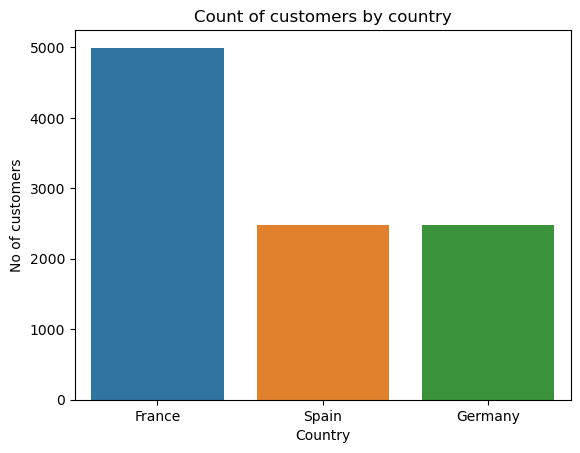

In [ ]:
#Bar plot for "Geography"
sns.countplot(data=churn, x="Geography")
plt.title("Count of customers by country")
plt.xlabel("Country")
plt.ylabel("No of customers")

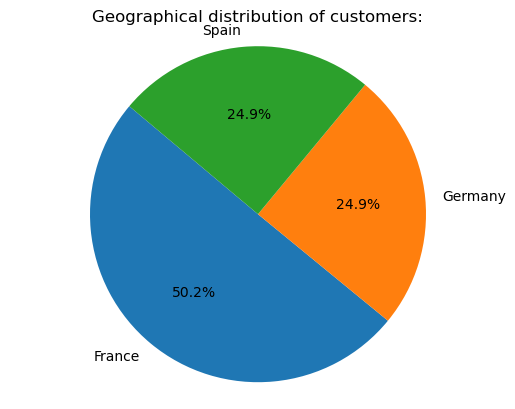

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(country, labels = country.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Geographical distribution of customers:")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()

Observations
 
We can see  from the frequency table, bar chart and pie chart that spain and germany distribution are the same but France twice the data of either, so it can be deducted that around 50% of our customers have bank account in france, may be the bank is french or it established in france years ago or has services in france that doesn't have in other countries

### 1.C. Categorical - Gender distribution


In [ ]:
gender = churn["Gender"].value_counts()
print("diversity in terms of gender :")
print(gender)

diversity in terms of gender :
Gender
Male      5387
Female    4480
Name: count, dtype: int64


we can see females are less than males by 900


Text(0, 0.5, 'No of customers')

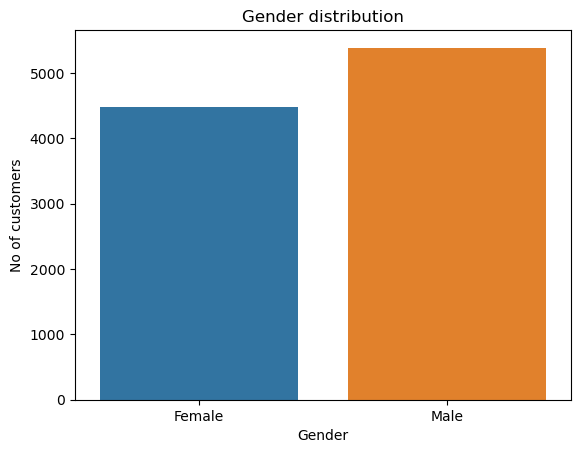

In [ ]:
#Bar plot for "Gender"
sns.countplot(data=churn, x="Gender")
plt.title("Gender distribution")
plt.xlabel("Gender")
plt.ylabel("No of customers")

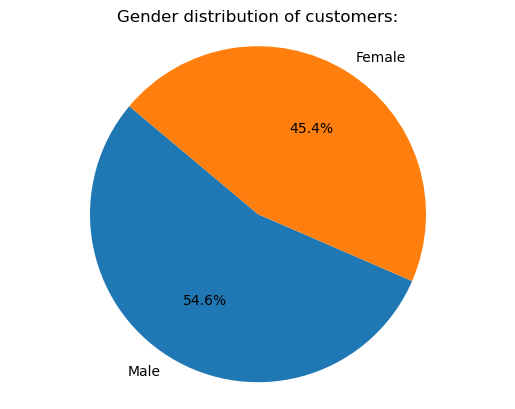

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(gender, labels = gender.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Gender distribution of customers:")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()

female customers are around 9% less than male customers

#### 1.C. Categorical - Boolean categorical data - Active vs Deactive


In [ ]:
active = churn["IsActiveMember"].value_counts()
print("Active users vs deactive users :")
print(active)

Active users vs deactive users :
IsActiveMember
1.0    5176
0.0    4887
Name: count, dtype: int64


Text(0, 0.5, 'No of customers')

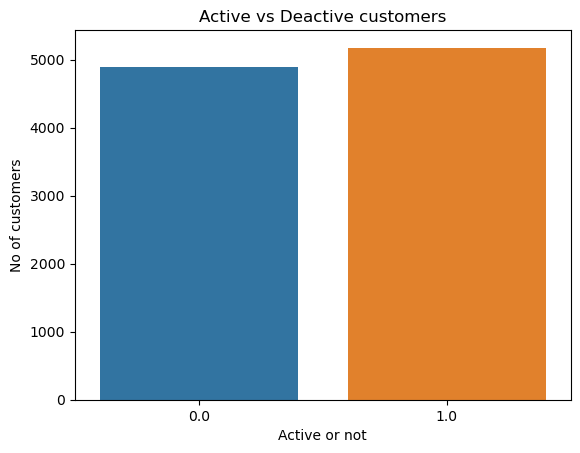

In [ ]:
#Bar plot for "Active Customers"
sns.countplot(data=churn, x="IsActiveMember")
plt.title("Active vs Deactive customers")
plt.xlabel("Active or not")
plt.ylabel("No of customers")

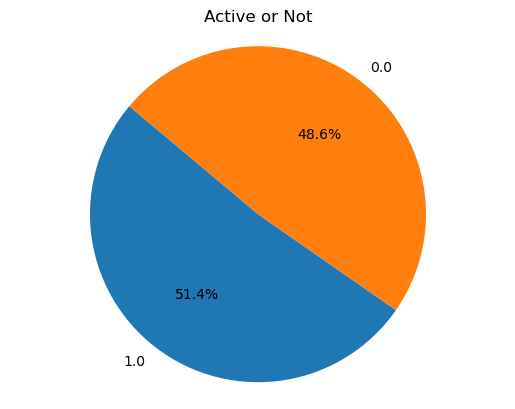

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(active, labels = active.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Active or Not")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()



Number of active and deactive members are approximately similar, as it is a bit weird that both are the same number(Activated members should be much more ) which maybe due to some history, feature missing or some particular need they had that was met by other banks(it is worth to read the data dictionary to see what do they mean by activated or deactivated member, I assume the deactive customers just don't use their account for anything). We should investigate on this and use multivariate analysis maybe on deactive and tenure or salary or number of products they used in past. We can also look at their geography and credit score. whether they exited or not they are just there as they don't use their account anymore we should consider them as exited , however they may have balance which will make them beneficial for bank and they are approachable as they haven't exited yet. 


#### 1. C. Categorical data analysis - Booliean Categorical data - Card owners 

In [ ]:
# Has card or not
card_owner = churn["HasCrCard"].value_counts()
print("Card owners :")
print(card_owner)


Card owners :
HasCrCard
1.0    7108
0.0    2959
Name: count, dtype: int64


Text(0, 0.5, 'No of customers')

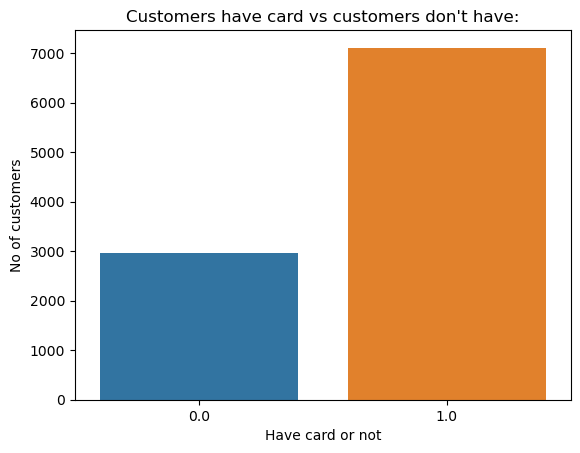

In [ ]:
#Bar plot for "HasCard or not"
sns.countplot(data=churn, x="HasCrCard")
plt.title("Customers have card vs customers don't have:")
plt.xlabel("Have card or not")
plt.ylabel("No of customers")

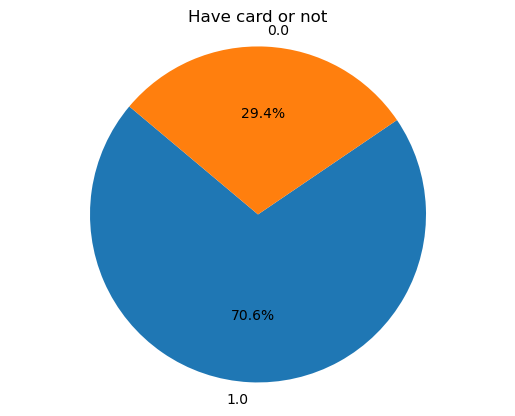

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(card_owner, labels = card_owner.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Have card or not")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()

30% of customers don't have cards which is weird, we should see couple of multivariate charts to analyze the cause. we can look into the tenure which can show how long did they use their account, based on country or number fo products they used, maybe other competitors offer better packages. How much those accounts balance are. For the purpose of saving, some people may open a bank account (type of the account can be useable as well, long-term saving account or not) for the sake of saving and don't use it on daily basis so they don't get cards on purpose. I do this myself want to control my finances as well

#### 1. C. Categorical data analysis - Booliean Categorical Data - Exit customers

In [ ]:
# exited or not
exit = churn["Exited"].value_counts()
print("Number of Customers exited vs remained :")
print(exit)


Number of Customers exited vs remained :
Exited
0    8084
1    2066
Name: count, dtype: int64


In [ ]:
churn.columns


Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited'],
      dtype='object')

Text(0, 0.5, 'No of customers')

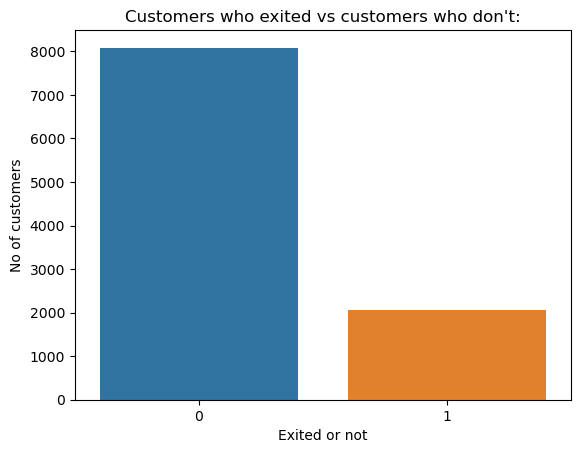

In [ ]:
#Bar plot for "HasCard or not"
sns.countplot(data=churn, x="Exited")
plt.title("Customers who exited vs customers who don't:")
plt.xlabel("Exited or not")
plt.ylabel("No of customers")

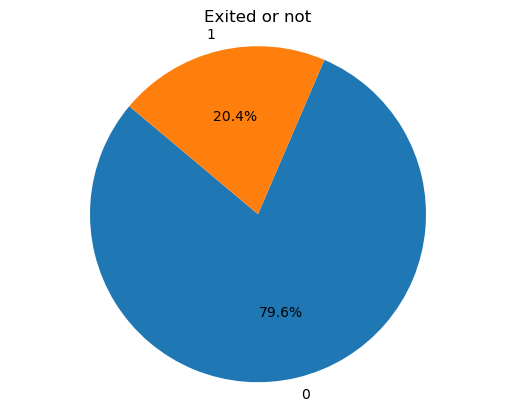

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(exit, labels = exit.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Exited or not")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()

We can see 20% of the customers exited which can be high depending on their tenure. We can see what was their tenure, balance, credit score,number of products activation status to get more insight into their behaviour.


##### Bonus for C: Although credit score is integer 
##### it can be interpreted as good, bad, midium categories let's see what we can deduct

In [ ]:
# to define the range of the labels I would like to see min and max to decide on the steps
slots = churn["CreditScore"].quantile([0, 1/3, 2/3, 1])
range = pd.cut(churn["CreditScore"], bins=slots, labels=["low", "medium", "high"])
churn["Credit_Score_status"] = range
churn.head(10)

#churn.drop(columns= "Credit_Category", inplace=True)
churn.head(10)

NameError: name 'churn' is not defined

In [ ]:
# Credit_score_status category frequency table
score_status = churn["Credit_Score_status"].value_counts()
print("Categorizing the credit score status of our customers:")
print(score_status)

Categorizing the credit score status of our customers:
Credit_Score_status
low       3402
medium    3376
high      3349
Name: count, dtype: int64


As I didn't know the good and medium credit scores I just devide them normally in the range of mean and max

c:\Users\donna\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Text(0, 0.5, 'No of customers')

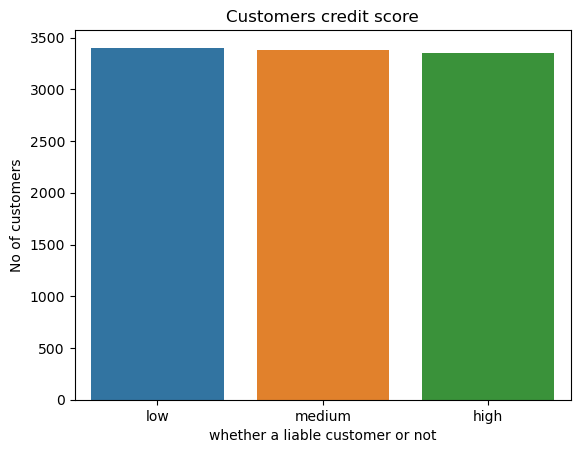

In [ ]:
#Bar plot for "Credit_Status"
sns.countplot(data=churn, x="Credit_Score_status")
plt.title("Customers credit score")
plt.xlabel("whether a liable customer or not")
plt.ylabel("No of customers")

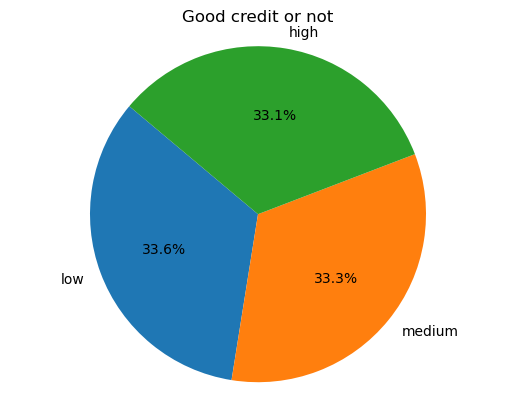

In [ ]:
# I would like to see the percentages in pie chart 
plt.pie(score_status, labels = score_status.index, autopct = "%1.1f%%", startangle= 140)
plt.title("Good credit or not")
plt.axis("equal") # to make sure the pie chart is circular
plt.show()

#### 1.C. Numerical data - Histogram

In [ ]:
churn.head(10)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
0,15634602,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1,medium
1,15647311,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0,low
2,15619304,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1,low
3,15701354,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0,high
4,15737888,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0,high
5,15574012,645.0,Spain,Male,44.0,8.0,113755.78,2.0,1.0,0.0,149756.71,1,medium
6,15592531,822.0,France,Male,50.0,7.0,0.00,2.0,1.0,1.0,10062.80,0,high
7,15656148,376.0,Germany,Female,29.0,4.0,115046.74,4.0,1.0,0.0,119346.88,1,low
8,15792365,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0,low
9,15592389,684.0,France,Male,27.0,2.0,134603.88,1.0,1.0,1.0,71725.73,0,medium


### I want to plot histogram for the following columns
1. CreditScore
2. Age
3. Tenure
4. Balance
5. number fo products
6. estimated salary


In [ ]:
#churn["Age"] = pd.to_numeric(churn["Age"]).astype("Int64")
#churn["Age"].dtype
churn["Age"].head()

0    42.0
1    41.0
2    42.0
3    39.0
4    43.0
Name: Age, dtype: float64

In [ ]:
Number_columns = churn.select_dtypes(include = "number").columns.tolist()
Number_columns

['CustomerId',
 'CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary',
 'Exited']

##### 1.C. Numerical data - Histogram - Credit Score

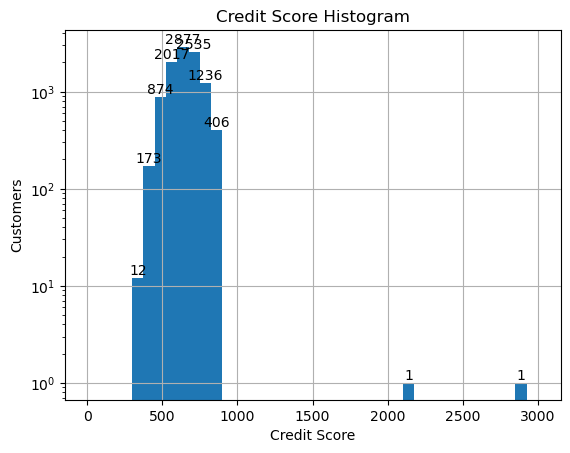

In [ ]:
# No need for customer id and the last 4 boolean columns
# plot the histogram
# 1. CreditScore
values, bins, _= plt.hist(churn["CreditScore"], bins=40, range=(0, 3000))
plt.title("Credit Score Histogram")
plt.xlabel("Credit Score")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
plt.grid(True)
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")

plt.yscale("log")
plt.show()


We can see that most of our customers'credit scores are between 550 to 900
we have two defo outliers with so high values :2200ish and 2900ish
12 are 2hundred sth to 350 let's see their values:

In [ ]:
churn_sorted = churn.sort_values("CreditScore", ascending=False)
churn_sorted.head(2)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
8493,15727619,2924.008649,Germany,Female,46.0,9.0,113909.69,3.0,1.0,0.0,92320.37,1,high
2258,15776631,2158.510025,France,Female,36.0,5.0,119540.15,1.0,0.0,1.0,80603.99,0,high


#### Observation
These two outliers one who exited one withiout card but active member and balance 119540.15 and the other who is not an active memeber and exited after 9 years (this is obvious data I wonder if they are approximately the same or not) with balance 113909.69

In [ ]:
churn_sorted

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
8493,15727619,2924.008649,Germany,Female,46.0,9.0,113909.69,3.0,1.0,0.0,92320.37,1,high
2258,15776631,2158.510025,France,Female,36.0,5.0,119540.15,1.0,0.0,1.0,80603.99,0,high
2137,15588219,850.000000,France,NaN,38.0,1.0,106871.81,2.0,1.0,0.0,29333.01,0,high
5165,15688612,850.000000,France,Male,33.0,7.0,140956.99,1.0,0.0,0.0,3510.18,0,high
6200,15569654,850.000000,Germany,Female,31.0,3.0,51293.47,1.0,0.0,0.0,35534.68,0,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4870,15573888,NaN,Germany,Female,43.0,1.0,107963.38,1.0,0.0,0.0,186438.86,1,NaN
7925,15800482,NaN,Spain,Female,33.0,7.0,0.00,2.0,1.0,1.0,168261.40,0,NaN
8703,15595350,NaN,France,NaN,31.0,3.0,136067.82,2.0,1.0,0.0,65567.91,0,NaN
8846,15616365,NaN,France,Female,53.0,2.0,0.00,2.0,1.0,0.0,28045.77,0,NaN


In [ ]:
# I just wanted to see how many people were active but exited in our dataset,
# I see a relationship among is active has card and exited from the conceptual point of view

Exited_Active = churn[(churn["IsActiveMember"] == 1) & (churn["Exited"] == 1)]
Exited_Active.shape


(740, 13)

#### 1.C. Numerical data - Histogram - Age

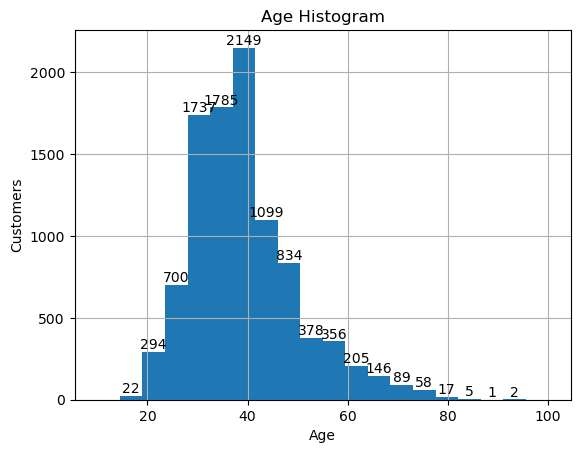

In [ ]:
values, bins, _= plt.hist(churn["Age"], bins=20, range=(10,100))
#plt.hist(churn["Age"], bins=20, range=(10,100))
plt.title("Age Histogram")
plt.xlabel("Age")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()


It looks like bell diagram or guassian distribution which is skewed more to younger customers. Most of our customer between 27ish to 42 ish
on the right hand side we have few people in 80 to 100 age range and a relatively low number between 60 and 80 which we may look into to whether drop them from the list or not (maybe from 75 above)
on the left hand side we have eww people under 20 years old (we can later analyze whether these are valuable or not)

#### 1.C. Numerical data - Histogram - Tenure

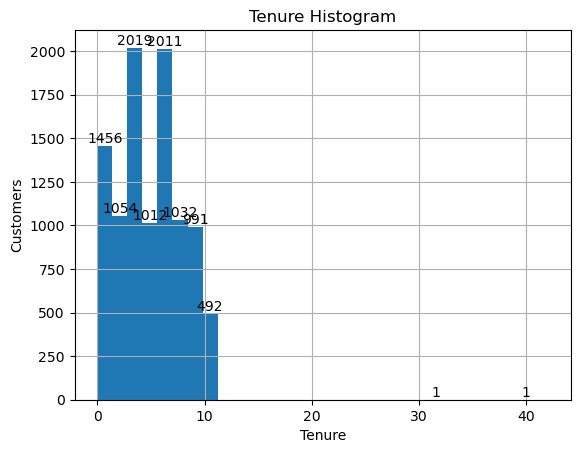

In [ ]:
#plt.hist(churn["Tenure"], bins=60, range=(0,churn["Tenure"].max()))
values, bins, _= plt.hist(churn["Tenure"], bins=30, range=(0,churn["Tenure"].max()+2 ))
plt.title("Tenure Histogram")
plt.xlabel("Tenure")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

we have two outliers in tenure diagram, all the others are between 0 to 10 years.

In [ ]:
df = churn[churn["Tenure"] > 30]
df.head(10)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
5204,15704231,430.0,France,Female,33.0,32.044103,0.00,1.0,1.0,1.0,69759.91,0,low
10100,15775490,660.0,France,Female,38.0,40.066513,110570.78,2.0,1.0,0.0,195906.59,0,medium


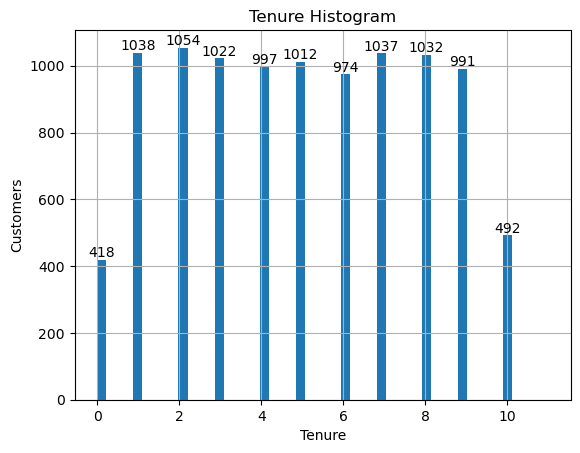

In [ ]:
values, bins, _= plt.hist(churn["Tenure"], bins=50, range=(0,11))
plt.title("Tenure Histogram")
plt.xlabel("Tenure")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

We can see most of the customers have been customers between 1 to 9 years, we have about 0.1 of our data in both ends which is high. let's look into them:

In [ ]:
df = churn[(churn["Tenure"] == 0) | (churn["Tenure"] == 10)]
df.head()
df.head()

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
12,15632264,476.0,France,Female,34.0,10.0,0.00,2.0,1.0,0.0,26260.98,0,low
29,15656300,411.0,France,Male,29.0,0.0,59697.17,2.0,1.0,1.0,53483.21,0,low
35,15794171,475.0,France,Female,45.0,0.0,134264.04,1.0,1.0,0.0,27822.99,1,low
50,15616550,698.0,Germany,Male,44.0,10.0,116363.37,2.0,1.0,0.0,198059.16,0,high
57,15647091,725.0,Germany,Male,19.0,0.0,75888.20,1.0,0.0,0.0,45613.75,0,high


In [ ]:
df.shape

(910, 13)

In [ ]:
df[df["IsActiveMember"] ==1]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
29,15656300,411.0,France,Male,29.0,0.0,59697.17,2.0,1.0,1.0,53483.21,0,low
67,15641582,735.0,Germany,Male,43.0,10.0,NaN,2.0,1.0,1.0,196673.28,0,high
72,15812518,657.0,Spain,Female,37.0,0.0,163607.18,1.0,0.0,1.0,44203.55,0,medium
85,15805254,652.0,Spain,Female,75.0,10.0,0.00,2.0,1.0,1.0,114675.75,0,medium
95,15699461,515.0,Spain,Male,35.0,10.0,176273.95,1.0,0.0,1.0,121277.78,0,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10067,15776545,682.0,France,Male,28.0,10.0,200724.96,1.0,0.0,1.0,82872.64,1,medium
10092,15627439,624.0,Spain,Female,36.0,10.0,0.00,2.0,0.0,1.0,186180.42,0,medium
10128,15805162,550.0,France,Male,25.0,0.0,0.00,2.0,1.0,1.0,184221.11,0,low
10137,15684103,674.0,France,Female,26.0,10.0,0.00,2.0,1.0,1.0,138423.10,0,medium


In [ ]:
df[df["Balance"] ==0]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
12,15632264,476.0,France,Female,34.0,10.0,0.0,2.0,1.0,0.0,26260.98,0,low
85,15805254,652.0,Spain,Female,75.0,10.0,0.0,2.0,1.0,1.0,114675.75,0,medium
92,15809248,524.0,France,Female,36.0,10.0,0.0,2.0,1.0,0.0,109614.57,0,low
149,15794413,416.0,France,Male,32.0,0.0,0.0,2.0,0.0,1.0,878.87,0,low
176,15645248,510.0,France,Female,30.0,0.0,0.0,2.0,1.0,1.0,130553.47,0,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10128,15805162,550.0,France,Male,25.0,0.0,0.0,2.0,1.0,1.0,184221.11,0,low
10131,15686913,757.0,France,Male,NaN,0.0,0.0,1.0,1.0,0.0,83263.06,0,high
10137,15684103,674.0,France,Female,26.0,10.0,0.0,2.0,1.0,1.0,138423.10,0,medium
10141,15754113,588.0,France,Female,35.0,0.0,0.0,2.0,1.0,1.0,155485.24,0,low


I wanted to get more insight into the data as the furthest points can give us some useful info. We can see that 9% of our customers are either new or the most loyal. From which half of them are active and 30% have 0 balance

#### 1.C. Numerical data - Histogram - Balance

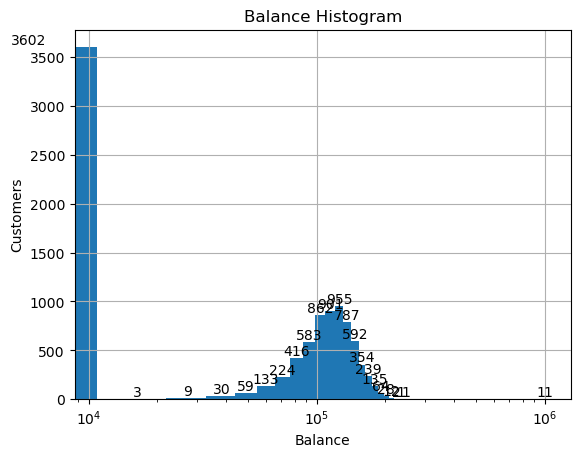

In [ ]:
values, bins, _= plt.hist(churn["Balance"], bins=95, range=(0,churn["Balance"].max()+2 ))
plt.title("Balance Histogram")
plt.xlabel("Balance")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.xscale("log")
plt.grid(True)
plt.show()

Based on the data we have 11 people with around 1 million euro in their bank account and 3602 people with 0 to 10000 euro in their bank account let's have a closer look.

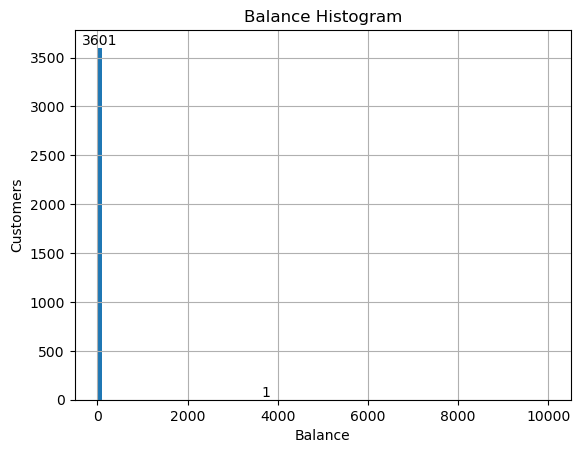

In [ ]:
values, bins, _= plt.hist(churn["Balance"], bins=95, range=(0,10000 ))
plt.title("Balance Histogram")
plt.xlabel("Balance")
plt.ylabel("Customers")
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

so we have 1 customer with 4000 euro balance and 3601 with 0 balance 


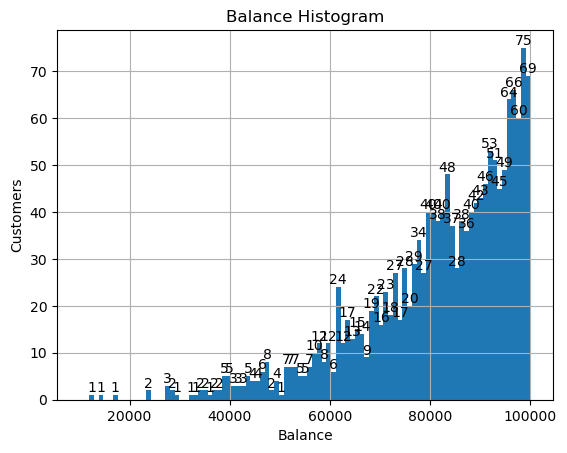

In [ ]:
values, bins, _= plt.hist(churn["Balance"], bins=95, range=(10000, 100000 ))
plt.title("Balance Histogram")
plt.xlabel("Balance")
plt.ylabel("Customers")
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

so 3 customers between 10000 and 20000, 8 cusotmers between 20000 and 30000 and the rest between 30000 and 1000000 from the right half

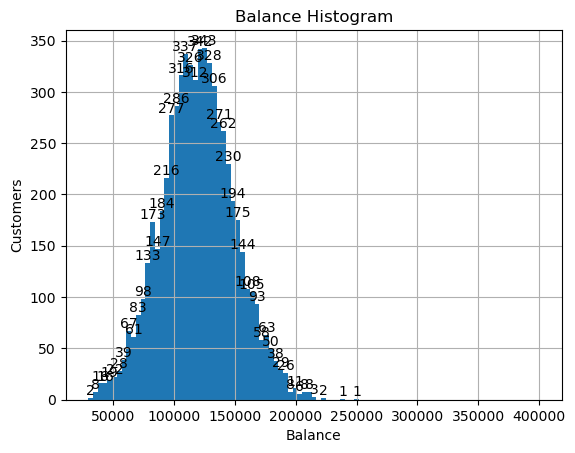

In [ ]:
values, bins, _= plt.hist(churn["Balance"], bins=95, range=(30000, 400000 ))
plt.title("Balance Histogram")
plt.xlabel("Balance")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

so most of the customers have balance between 30000 and 250000  out of 10151 cusotmers, and one third with 0 balance . It is normally distributed. I would say from the diagram the outliers are customers with balance more than 180000 or less than 6000 

#### 1.C. Numerical data - Histogram - Number of Products
to do list for numerical histogram:

5. number of products
6. estimated salary

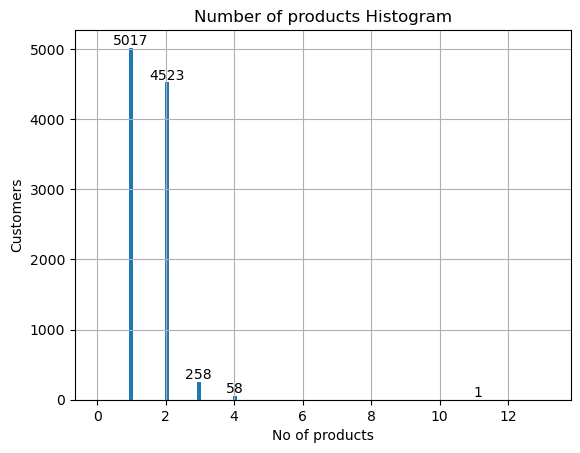

In [ ]:
values, bins, _= plt.hist(churn["NumOfProducts"], bins=100, range=(0,churn["NumOfProducts"].max()+2 ))
plt.title("Number of products Histogram")
plt.xlabel("No of products")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

We can see that most of our customers have 1 to 2 products, 1 only has 11 products who is an outlier and also 58 with 4 products and 258 with 3 products are rare cases among 10000 customers

#### 1.C. Numerical data - Histogram - Extimated Salary

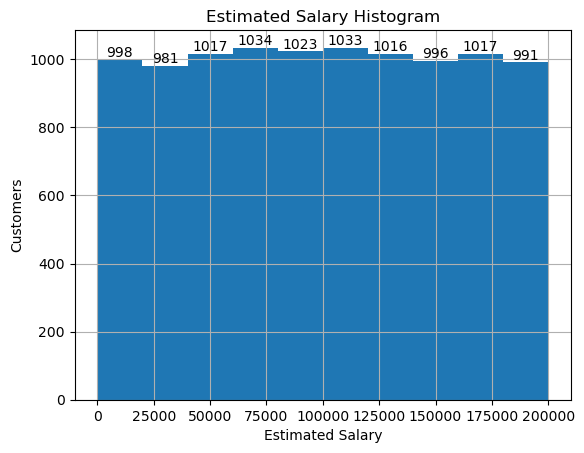

In [ ]:
values, bins, _= plt.hist(churn["EstimatedSalary"], bins=10, range=(0,churn["EstimatedSalary"].max()+2 ))
plt.title("Estimated Salary Histogram")
plt.xlabel("Estimated Salary")
plt.ylabel("Customers")
# I couldn't see the max point so I scale logarithmic to be able to see sparse points
# I would like to see the numbers as I browse so I am adding text
for i ,  val in enumerate(values):
    if val != 0:
            plt.text(bins[i] + (bins[i+1] -bins[i])/2, val, str(int(val)), ha="center", va="bottom")
plt.grid(True)
plt.show()

It seems fairly distributed most of the customers have salary between the four middle slots of the chart (it is a normal distribution ). It seems that the algorithm that estimates the salary doesn't work properly as other diagrams were not this rectangularly distributed. Estimted salary should be based on creditscore, tenure(the longer a customer is customer the better algorithm can predict the salary), balance and No of transcations(That we dont have), . This seems done by a machine and is not natural.

### 2. Are there duplicates? if so remove them

I have already removed the first duplicates which were the first two columns as  redundant columns. Now, let's look at the duplicates. 
Here is my strategy:
1. Understanding the dataset and context - maybe a geniun repetition - I already did it in the first question
2. Duplicates criteria based on specific columns or entire row
3.  Determine which duplicates to keep and which to discard
4. Impact on analysis
5. How missing values are handled - in this case NaNs which for pandas are distinct values not identical
6. verify if removing duplicates is ok


In [ ]:
# let's see what are our duplicates based on customerID which I think is meaningful 
duplicates = churn[churn.duplicated()]
duplicates
print("Duplicated Rows:")
duplicates

Duplicated Rows:


,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
10001,15664752,606.0,Germany,Male,39.0,8.0,136000.45,2.0,1.0,0.0,31708.53,0,low
10004,15592194,492.0,France,Female,28.0,9.0,0.00,2.0,1.0,0.0,95957.09,0,low
10005,15621550,535.0,Spain,Female,50.0,1.0,140292.58,3.0,0.0,0.0,69531.22,1,low
10006,15659355,671.0,Spain,Male,32.0,6.0,123912.78,2.0,1.0,1.0,146636.44,0,medium
10007,15723671,661.0,France,Male,35.0,9.0,100107.99,1.0,1.0,0.0,83949.68,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10144,15806249,671.0,Spain,Female,31.0,4.0,0.00,2.0,0.0,1.0,79270.02,0,medium
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0,medium
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1,high
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0,medium


In [ ]:
#Let's sort the duplicates
sorted_duplicates = duplicates.sort_index(ascending=False)
sorted_duplicates

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
10149,15792365,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0,low
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0,medium
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1,high
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0,medium
10144,15806249,671.0,Spain,Female,31.0,4.0,0.00,2.0,0.0,1.0,79270.02,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10007,15723671,661.0,France,Male,35.0,9.0,100107.99,1.0,1.0,0.0,83949.68,0,medium
10006,15659355,671.0,Spain,Male,32.0,6.0,123912.78,2.0,1.0,1.0,146636.44,0,medium
10005,15621550,535.0,Spain,Female,50.0,1.0,140292.58,3.0,0.0,0.0,69531.22,1,low
10004,15592194,492.0,France,Female,28.0,9.0,0.00,2.0,1.0,0.0,95957.09,0,low


In [ ]:
duplicates_customerID= churn[churn.duplicated(subset=["CustomerId"])].sort_index(ascending=False)
duplicates_customerID

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
10149,15792365,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0,low
10148,15680167,635.0,France,Female,78.0,6.0,47536.40,1.0,NaN,1.0,119400.08,0,medium
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0,medium
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1,high
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10004,15592194,492.0,France,Female,28.0,9.0,0.00,2.0,1.0,0.0,95957.09,0,low
10003,15615096,492.0,France,Female,31.0,7.0,NaN,2.0,1.0,1.0,49463.44,0,low
10002,15809772,667.0,France,Male,48.0,2.0,0.00,1.0,1.0,0.0,43229.20,0,medium
10001,15664752,606.0,Germany,Male,39.0,8.0,136000.45,2.0,1.0,0.0,31708.53,0,low


Based on the above data I found duplicates on customerID and also duplicates on the entire rows 
which means there are two rows for the same customer ID with different values. Customer ID should be unique.
First let validate the duplicates and see what columns are duplicated :
for all the  104 rows with exact duplicates I can apply the duplicates and for duplicates on customer id I got 150 which means we have 46 rows with the same customer ID but different values in one or some columns. We should check the difference. below I did some manual tests. Then for that 46 customer ids fill the missing values by the other row.

In [ ]:
row_similar= churn.loc[churn["CustomerId"] == 15615096]

row_similar

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
2105,15615096,492.0,France,Female,NaN,7.0,0.0,2.0,1.0,1.0,49463.44,0,low
10003,15615096,492.0,France,Female,31.0,7.0,NaN,2.0,1.0,1.0,49463.44,0,low


We have two rows with exact same values but in one or other they have missing values so first let's get rid of the duplicates. The copy the missing values from one to the other and delete the duplicated customer ids.

In [ ]:
churn.shape

(10150, 13)

These rows can be deleted as they are the same for the first dataset duplicates without customer id. Lets check; 

In [ ]:
churn.drop_duplicates(inplace=True)


In [ ]:
churn

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
0,15634602,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1,medium
1,15647311,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0,low
2,15619304,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1,low
3,15701354,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0,high
4,15737888,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10131,15686913,757.0,France,Male,NaN,0.0,0.00,1.0,1.0,0.0,83263.06,0,high
10133,15731553,730.0,France,Male,23.0,8.0,0.00,2.0,1.0,0.0,183284.53,0,high
10136,15756820,655.0,France,Female,26.0,NaN,106198.50,1.0,0.0,1.0,32020.42,0,medium
10138,15653306,679.0,Germany,Female,32.0,0.0,88335.05,NaN,0.0,0.0,159584.81,0,medium


To do:
1. First clean the value of each column considering when repetitive rows have different values on some columns.
2. then I merge the original data with this clean dataframe together and drop duplicates keeping the last occurence
3. Test if it is correct and make sure 
4. apply inplace

In [ ]:
# 1. Clean the values of each column on rows with the same customer ID and make sure pick the correct one
duplicates_customerID

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
10149,15792365,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0,low
10148,15680167,635.0,France,Female,78.0,6.0,47536.40,1.0,NaN,1.0,119400.08,0,medium
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0,medium
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1,high
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10004,15592194,492.0,France,Female,28.0,9.0,0.00,2.0,1.0,0.0,95957.09,0,low
10003,15615096,492.0,France,Female,31.0,7.0,NaN,2.0,1.0,1.0,49463.44,0,low
10002,15809772,667.0,France,Male,48.0,2.0,0.00,1.0,1.0,0.0,43229.20,0,medium
10001,15664752,606.0,Germany,Male,39.0,8.0,136000.45,2.0,1.0,0.0,31708.53,0,low


In [ ]:
sorted_duplicates
sorted_duplicates


,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
10149,15792365,501.0,France,Male,44.0,4.0,142051.07,2.0,0.0,1.0,74940.50,0,low
10147,15792029,620.0,France,Male,32.0,6.0,0.00,2.0,1.0,0.0,56139.09,0,medium
10146,15779522,736.0,France,Female,24.0,0.0,0.00,2.0,1.0,0.0,109355.73,1,high
10145,15792151,635.0,Spain,Female,37.0,3.0,0.00,2.0,1.0,0.0,91086.73,0,medium
10144,15806249,671.0,Spain,Female,31.0,4.0,0.00,2.0,0.0,1.0,79270.02,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10007,15723671,661.0,France,Male,35.0,9.0,100107.99,1.0,1.0,0.0,83949.68,0,medium
10006,15659355,671.0,Spain,Male,32.0,6.0,123912.78,2.0,1.0,1.0,146636.44,0,medium
10005,15621550,535.0,Spain,Female,50.0,1.0,140292.58,3.0,0.0,0.0,69531.22,1,low
10004,15592194,492.0,France,Female,28.0,9.0,0.00,2.0,1.0,0.0,95957.09,0,low


In [ ]:
duplicates_customerID.sort_values(by="CustomerId", inplace=True)
sorted_duplicates.sort_values(by="CustomerId", inplace=True)
left = duplicates_customerID
right = sorted_duplicates
merged= left.merge(right,on='CustomerId', how="left",suffixes=(' ', '_right') , indicator=True)
columns_to_keep = merged.columns
merged[columns_to_keep]
excluding_exact_dup = merged[merged['_merge'] == 'left_only']

excluding_exact_dup= excluding_exact_dup.drop(columns=['_merge']+[col for col in excluding_exact_dup.columns if '_right' in col])
excluding_exact_dup.shape

(45, 13)

There are 45 duplicated customer ids with some missing data in one or the other

In [ ]:
sorted_dup = sorted_duplicates["CustomerId"].sort_values()
sorted_dup.info()

<class 'pandas.core.series.Series'>
Index: 104 entries, 10029 to 10015
Series name: CustomerId
Non-Null Count  Dtype
--------------  -----
104 non-null    int64
dtypes: int64(1)
memory usage: 1.6 KB


So I would like to check the values in the original dataset 

In [ ]:
# I would do the same for same_rows to get the common columns but on churn dataset
common_values_original = churn.merge(duplicates_customerID, how="inner", indicator=True)
same_rows_original = common_values_original[common_values_original["_merge"] == "both"]
same_rows_original = same_rows_original.sort_values(by="CustomerId")
same_rows_original.drop_duplicates()

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,_merge
4,15566594,709.0,Spain,Male,23.0,10.0,0.00,2.0,0.0,0.0,129590.18,0,high,both
61,15566740,587.0,Spain,Male,51.0,3.0,83739.32,1.0,0.0,1.0,148798.45,0,low,both
120,15568106,592.0,France,Female,NaN,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low,both
46,15568429,633.0,Spain,Female,46.0,3.0,0.00,2.0,1.0,0.0,120250.58,0,medium,both
134,15568595,544.0,France,Male,NaN,9.0,113829.45,1.0,1.0,1.0,124341.49,0,low,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,15805162,550.0,France,Male,25.0,0.0,0.00,2.0,1.0,1.0,184221.11,0,low,both
70,15806249,671.0,Spain,Female,31.0,4.0,0.00,2.0,0.0,1.0,79270.02,0,medium,both
5,15806964,702.0,France,Male,45.0,0.0,80793.58,1.0,1.0,1.0,27474.81,0,high,both
104,15809772,667.0,France,Male,48.0,2.0,0.00,1.0,1.0,0.0,43229.20,0,medium,both


It is time to remove the duplicates by customer ID as it is unique Id, it seems that it doesn't make any differnece whether we keep the first or last, I woul dlike to keep the most completed one without NaNs as some of the duplicates contain NaNs on one occurance. However, I found some occurances that one duplicate contains NaN the other contain data in some columns. Here is what I do:

In [ ]:
churn.duplicated().sum()
    


0

In [ ]:
churn.head().T

,0,1,2,3,4
CustomerId,15634602,15647311,15619304,15701354,15737888
CreditScore,619.0,608.0,502.0,699.0,850.0
Geography,France,Spain,France,France,Spain
Gender,Female,Female,Female,Female,Female
Age,42.0,41.0,42.0,39.0,43.0
Tenure,2.0,1.0,8.0,1.0,2.0
Balance,0.0,83807.86,159660.8,0.0,125510.82
NumOfProducts,1.0,1.0,3.0,2.0,1.0
HasCrCard,1.0,0.0,1.0,0.0,1.0
IsActiveMember,1.0,1.0,0.0,NaN,1.0


In [ ]:
churn.loc[churn.duplicated(subset=['CustomerId']), "CustomerId"].unique()

array([15698324, 15809772, 15615096, 15617507, 15705506, 15761487,
       15591724, 15613017, 15780835, 15645766, 15593425, 15591123,
       15780954, 15607598, 15611579, 15585835, 15794870, 15568106,
       15591980, 15754820, 15793478, 15709920, 15768137, 15789313,
       15724402, 15624820, 15725311, 15733661, 15794266, 15775490,
       15568595, 15796074, 15614962, 15768340, 15784594, 15736816,
       15650244, 15725818, 15790689, 15652400, 15705298, 15686913,
       15731553, 15756820, 15653306, 15680167], dtype=int64)

In [ ]:
churn.loc[churn["CustomerId"]==15615096].T

,2105,10003
CustomerId,15615096,15615096
CreditScore,492.0,492.0
Geography,France,France
Gender,Female,Female
Age,NaN,31.0
Tenure,7.0,7.0
Balance,0.0,NaN
NumOfProducts,2.0,2.0
HasCrCard,1.0,1.0
IsActiveMember,1.0,1.0


In [ ]:
churn.shape

(10046, 13)

In [ ]:
churn

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
0,15634602,619.0,France,Female,42.0,2.0,0.00,1.0,1.0,1.0,101348.88,1,medium
1,15647311,608.0,Spain,Female,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58,0,low
2,15619304,502.0,France,Female,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57,1,low
3,15701354,699.0,France,Female,39.0,1.0,0.00,2.0,0.0,NaN,93826.63,0,high
4,15737888,850.0,Spain,Female,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10,0,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10131,15686913,757.0,France,Male,NaN,0.0,0.00,1.0,1.0,0.0,83263.06,0,high
10133,15731553,730.0,France,Male,23.0,8.0,0.00,2.0,1.0,0.0,183284.53,0,high
10136,15756820,655.0,France,Female,26.0,NaN,106198.50,1.0,0.0,1.0,32020.42,0,medium
10138,15653306,679.0,Germany,Female,32.0,0.0,88335.05,NaN,0.0,0.0,159584.81,0,medium


In [ ]:
columns_to_check = churn[churn.duplicated(subset=['CustomerId'], keep=False)]
columns_to_check.sort_values(by="CustomerId")

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
1553,15568106,592.0,France,Female,38.0,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low
10068,15568106,592.0,France,Female,NaN,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low
658,15568595,544.0,France,Male,64.0,9.0,113829.45,1.0,1.0,1.0,124341.49,0,low
10104,15568595,544.0,France,Male,NaN,9.0,113829.45,1.0,1.0,1.0,124341.49,0,low
10062,15585835,655.0,Spain,NaN,34.0,4.0,109783.69,2.0,1.0,0.0,134034.32,0,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10066,15794870,744.0,NaN,Male,38.0,6.0,73023.17,2.0,1.0,0.0,78770.86,0,high
10106,15796074,717.0,France,Female,36.0,2.0,99472.76,2.0,1.0,0.0,94274.72,1,high
4918,15796074,717.0,France,Female,NaN,2.0,99472.76,2.0,1.0,0.0,94274.72,1,high
10002,15809772,667.0,France,Male,48.0,2.0,0.00,1.0,1.0,0.0,43229.20,0,medium


In [ ]:
df= churn.groupby("CustomerId").apply(lambda x:x.fillna(method="ffill").fillna(method="bfill"))

df= df.apply(lambda x: x.reset_index(drop=True))
        

C:\Users\donna\AppData\Local\Temp\ipykernel_11744\84807211.py:1: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [ ]:
df[df["CustomerId"] ==15568106]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
87,15568106,592.0,France,Female,38.0,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low
88,15568106,592.0,France,Female,38.0,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low


In [ ]:

df.sort_values(by="CustomerId")

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
0,15565701,698.0,Spain,NaN,39.0,9.0,161993.89,1.0,0.0,0.0,90212.38,0,high
1,15565706,612.0,Spain,Male,35.0,1.0,0.00,1.0,1.0,1.0,83256.26,1,medium
2,15565714,601.0,France,Male,47.0,1.0,64430.06,2.0,0.0,1.0,96517.97,0,low
3,15565779,627.0,Germany,Female,30.0,6.0,57809.32,1.0,1.0,0.0,188258.49,0,medium
4,15565796,745.0,Germany,Male,48.0,10.0,96048.55,1.0,1.0,0.0,74510.65,0,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,15815628,711.0,France,Female,37.0,8.0,113899.92,1.0,0.0,0.0,80215.20,0,high
10042,15815645,481.0,France,NaN,37.0,8.0,152303.66,2.0,1.0,1.0,175082.20,0,low
10043,15815656,541.0,Germany,Female,39.0,9.0,100116.67,1.0,1.0,1.0,199808.10,1,low
10044,15815660,758.0,France,Female,34.0,1.0,154139.45,1.0,1.0,1.0,60728.89,0,high


In [ ]:
df[df.duplicated(subset="CustomerId", keep="last")]



,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
87,15568106,592.0,France,Female,38.0,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low
105,15568595,544.0,France,Male,64.0,9.0,113829.45,1.0,1.0,1.0,124341.49,0,low
773,15585835,655.0,Spain,Female,34.0,4.0,109783.69,2.0,1.0,0.0,134034.32,0,medium
999,15591123,557.0,Germany,Male,68.0,2.0,100194.44,1.0,1.0,1.0,38596.34,0,low
1026,15591724,560.0,France,Female,44.0,5.0,143244.97,1.0,1.0,0.0,98661.27,0,low
1036,15591980,753.0,France,Male,33.0,5.0,122568.05,2.0,1.0,1.0,82820.85,0,high
1098,15593425,662.0,Spain,Female,54.0,1.0,187997.15,1.0,0.0,0.0,111442.71,1,medium
1660,15607598,575.0,Spain,Female,31.0,6.0,0.00,2.0,1.0,1.0,95686.42,0,low
1814,15611579,801.0,Spain,Male,42.0,4.0,141947.67,1.0,1.0,1.0,10598.29,0,high
1878,15613017,586.0,Germany,Male,32.0,1.0,149814.54,1.0,1.0,0.0,31830.06,0,low


In [ ]:
df.drop_duplicates(inplace=True,keep="last")

df[df["CustomerId"] ==15568106]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
88,15568106,592.0,France,Female,38.0,8.0,119278.01,2.0,0.0,1.0,19370.73,0,low


In [ ]:
df[df["CustomerId"] ==15615096]


,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
1966,15615096,492.0,France,Female,31.0,7.0,0.0,2.0,1.0,1.0,49463.44,0,low


In [ ]:
df.shape

(10001, 13)

In [ ]:
churn = df

In [ ]:
churn.shape

(10001, 13)

In [ ]:
churn[churn["CustomerId"] == 15565706	]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status
1,15565706,612.0,Spain,Male,35.0,1.0,0.0,1.0,1.0,1.0,83256.26,1,medium


Now that all the Repetitive customer IDs are recognized and the values safely substitued. let's go to the next question

### 3. Identifying the outliers - A Identifying outliers & B Choose the correct treatment


#### Univariate plots

I have already did that in the first question but I didn't do the box plot. I am going to do them again for the analysis and using my previous analysis to come up with some analysis, Then I am going to do multi variate plot analysis
then base on that I decide on the best outlier treatment and apply

In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status'],
      dtype='object')

In [ ]:
cols_for_plots= ['CreditScore','Geography', 'Gender','Age','Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited', 'Credit_Score_status']

In [ ]:
# plotting functions

def plot_hist(colname, df=churn, sorted=True):
    vc = df[colname].value_counts()
    if sorted:
        vc = vc.sort_values(ascending=False)
    

    go.Figure(
        data=[
            go.Bar(
                x=vc.index,
                y=vc.values
            )
        ],
        layout=go.Layout(
            title=colname
        )
    ).show()


def plot_box(colname, df=churn):
    go.Figure(
        data=[
            go.Box(
                x=df[colname],
                name=None
            )
        ],
        layout=go.Layout(
            title=colname
        )
    ).show()

In [ ]:
churn.dtypes

CustomerId                int64
CreditScore             float64
Geography                object
Gender                   object
Age                     float64
Tenure                  float64
Balance                 float64
NumOfProducts           float64
HasCrCard               float64
IsActiveMember          float64
EstimatedSalary         float64
Exited                    int64
Credit_Score_status    category
dtype: object

In [ ]:
for col in cols_for_plots:
    if churn[col].dtype in ["object", "bool"]:
        # print(col, "obj")
        plot_hist(col)
    else:
        # print("     ", col, "box")
        plot_box(col)

##### Outliers (using IQR approach)

In [ ]:
def univariate_outliers(s):
    """
    Input: series S
    Output: series with numerical values
    * 2: extreme high outlier 
    * 1: moderate high outlier/suspected outlier
    * -1: moderate low outlier/suspected outlier
    * -2: extreme low outlier
    """
    q1 = s.quantile(q=0.25)
    q3 = s.quantile(q=0.75)
    iqr = q3 - q1
    out = (
        (s > (q3 + 1.5 * iqr)).astype(int)
        + (s > (q3 + 3 * iqr)).astype(int)
        - (s < (q1 - 1.5 * iqr)).astype(int)
        - (s < (q1 - 3 * iqr)).astype(int)
    )
    return out

In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status'],
      dtype='object')

In [ ]:
outlier_to_test_col = ['CreditScore','Age', 'Tenure', 'Balance', 'NumOfProducts','EstimatedSalary']

In [ ]:
churn_outl_df = pd.DataFrame(
    {
        "outl_" + col: univariate_outliers(churn[col])
        for col in outlier_to_test_col
    }
)

In [ ]:
(
    churn_outl_df
    .melt()
    .reset_index()
    .pivot_table(
        index="variable",
        columns="value",
        values="index",
        aggfunc="count",
        fill_value=0
    )
)

value,-2,-1,0,1,2
variable,,,,,
outl_Age,2,0,9647,340,12
outl_Balance,0,0,9999,0,2
outl_CreditScore,0,15,9984,0,2
outl_EstimatedSalary,0,0,10001,0,0
outl_NumOfProducts,0,5,9937,58,1
outl_Tenure,0,1,9998,0,2


In [ ]:
# outlier bounds
def get_outlier_bounds(s):
   
    q1 = s.quantile(q=0.25)
    q3 = s.quantile(q=0.75)
    iqr = q3 - q1

    return [
        q1 - 3 * iqr,
        q1 - 1.5 * iqr,
        q3 + 1.5 * iqr,
        q3 + 3 * iqr
    ]

In [ ]:
get_outlier_bounds(churn["Balance"])

[-382921.185, -191460.5925, 319100.9875, 510561.58]

In [ ]:
churn_outl_df

,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
10041,0,0,0,0,0,0
10042,0,0,0,0,0,0
10043,0,0,0,0,0,0
10044,0,0,0,0,0,0


In [ ]:
outlier_bounds = {
    x: get_outlier_bounds(churn[x])
    for x in outlier_to_test_col
}
# outlier_bounds

In [ ]:
(churn_outl_df != 0).astype(int).sum(axis=1).plot(kind="box")
#(churn_outl_df != 0).astype(int).sum(axis=1).hist()

In [ ]:
# now join the outlier data to the general dataset
churn = pd.concat(
    [
        churn,
        churn_outl_df
    ],
    axis=1
)

In [ ]:
# let's add up the outlier columns
churn = pd.concat(
    [
        churn,
        churn_outl_df
    ],
    axis=1
)
churn=churn.loc[:,~churn.columns.duplicated() ]
churn


,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
0,15565701,698.0,Spain,NaN,39.0,9.0,161993.89,1.0,0.0,0.0,90212.38,0,high,0,0,0,0,0,0
1,15565706,612.0,Spain,Male,35.0,1.0,0.00,1.0,1.0,1.0,83256.26,1,medium,0,0,0,0,0,0
2,15565714,601.0,France,Male,47.0,1.0,64430.06,2.0,0.0,1.0,96517.97,0,low,0,0,0,0,0,0
3,15565779,627.0,Germany,Female,30.0,6.0,57809.32,1.0,1.0,0.0,188258.49,0,medium,0,0,0,0,0,0
4,15565796,745.0,Germany,Male,48.0,10.0,96048.55,1.0,1.0,0.0,74510.65,0,high,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,15815628,711.0,France,Female,37.0,8.0,113899.92,1.0,0.0,0.0,80215.20,0,high,0,0,0,0,0,0
10042,15815645,481.0,France,NaN,37.0,8.0,152303.66,2.0,1.0,1.0,175082.20,0,low,0,0,0,0,0,0
10043,15815656,541.0,Germany,Female,39.0,9.0,100116.67,1.0,1.0,1.0,199808.10,1,low,0,0,0,0,0,0
10044,15815660,758.0,France,Female,34.0,1.0,154139.45,1.0,1.0,1.0,60728.89,0,high,0,0,0,0,0,0


In [ ]:
churn[churn["outl_Age"] == 2]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
470,15578006,787.0,France,Female,85.0,10.0,0.00,2.0,1.0,1.0,116537.96,0,high,0,2,0,0,0,0
2158,15620443,711.0,France,Female,81.0,6.0,0.00,2.0,1.0,1.0,72276.24,0,high,0,2,0,0,0,0
2205,15621644,678.0,Germany,Male,83.0,6.0,123356.63,1.0,0.0,1.0,92934.41,0,medium,0,2,0,0,0,0
3483,15653251,408.0,France,Female,84.0,8.0,87873.39,1.0,0.0,0.0,188484.52,1,low,0,2,0,0,0,0
3810,15660878,705.0,France,Male,92.0,1.0,126076.24,2.0,1.0,1.0,34436.83,0,high,0,2,0,0,0,0
6671,15731569,850.0,France,Male,81.0,5.0,0.00,2.0,1.0,1.0,44827.47,0,high,0,2,0,0,0,0
8001,15764927,753.0,France,Male,92.0,3.0,121513.31,1.0,0.0,1.0,195563.99,0,high,0,2,0,0,0,0
8289,15772341,682.0,Germany,Male,81.0,6.0,122029.15,1.0,1.0,1.0,50783.88,0,medium,0,2,0,0,0,0
9343,15798024,537.0,Germany,Male,84.0,8.0,92242.34,1.0,1.0,1.0,186235.98,0,low,0,2,0,0,0,0
9445,15800554,850.0,France,Female,81.0,1.0,0.00,2.0,1.0,1.0,59568.24,0,high,0,2,0,0,0,0


In [ ]:
churn.to_csv("churn-with-outliers.csv")


#### now let's do bivariate plot analysis


In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status', 'outl_CreditScore',
       'outl_Age', 'outl_Tenure', 'outl_Balance', 'outl_NumOfProducts',
       'outl_EstimatedSalary'],
      dtype='object')

In [ ]:
churn

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
0,15565701,698.0,Spain,NaN,39.0,9.0,161993.89,1.0,0.0,0.0,90212.38,0,high,0,0,0,0,0,0
1,15565706,612.0,Spain,Male,35.0,1.0,0.00,1.0,1.0,1.0,83256.26,1,medium,0,0,0,0,0,0
2,15565714,601.0,France,Male,47.0,1.0,64430.06,2.0,0.0,1.0,96517.97,0,low,0,0,0,0,0,0
3,15565779,627.0,Germany,Female,30.0,6.0,57809.32,1.0,1.0,0.0,188258.49,0,medium,0,0,0,0,0,0
4,15565796,745.0,Germany,Male,48.0,10.0,96048.55,1.0,1.0,0.0,74510.65,0,high,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,15815628,711.0,France,Female,37.0,8.0,113899.92,1.0,0.0,0.0,80215.20,0,high,0,0,0,0,0,0
10042,15815645,481.0,France,NaN,37.0,8.0,152303.66,2.0,1.0,1.0,175082.20,0,low,0,0,0,0,0,0
10043,15815656,541.0,Germany,Female,39.0,9.0,100116.67,1.0,1.0,1.0,199808.10,1,low,0,0,0,0,0,0
10044,15815660,758.0,France,Female,34.0,1.0,154139.45,1.0,1.0,1.0,60728.89,0,high,0,0,0,0,0,0


In [ ]:
def plot_scatter_with_bounds(x, y, df=churn , bounds= outlier_bounds ):
    fig = go.Figure(
        data=[
            go.Scatter(
                x=df[x],
                y=df[y],
                mode="markers"
            )
        ],
        layout=go.Layout(
            title="{} vs {}".format(y, x),
            xaxis={"title": x},
            yaxis={"title": y}
        )
    )
    if bounds[y][0] >= df[y].min():
        fig.add_hline( # from y
            y=bounds[y][0],
            line_color="red"
        )
    fig.add_hline( # from y
        y=bounds[y][1],
        line_color="orange"
    )
    fig.add_hline( # from y
        y=bounds[y][2],
        line_color="orange"
    )
    if bounds[y][3] <= df[y].max():
        fig.add_hline( # from y
            y=bounds[y][3],
            line_color="red"
        )
    if bounds[x][0] >= df[x].min():
        fig.add_vline( # from x
            x=bounds[x][0],
            line_color="red"
        )
    fig.add_vline( # from x
        x=bounds[x][1],
        line_color="orange"
    )
    fig.add_vline( # from x
        x=bounds[x][2],
        line_color="orange"
    )
    if bounds[x][3] <= df[x].max():
        fig.add_vline( # from x
            x=bounds[x][3],
            line_color="red"
        )
    fig.show()


def plot_box_by_cat(x, y, df=churn, cutoff_count_x=10):
    fig = go.Figure(
        data=[
            go.Box(
                y=df.loc[df[x] == xval, y],
                name=str(xval),
                showlegend=False
            )
            for xval in np.sort(df[x].dropna().unique())
            if (df[x] == xval).sum() > cutoff_count_x
        ],
        layout=go.Layout(
            title="{} vs {}".format(y, x)
        )
    )
    fig.show()


def plot_cat_vs_cat(x, y,df=churn, norm=True, cutoff_count_x=10):
    p_df = (
        df[["id", x, y]]
        .dropna(how="any", axis=0)
        .pivot_table(index=y, columns=x, values="id", aggfunc="count")
    )
    p_df = p_df.loc[:, p_df.sum(axis=0) > cutoff_count_x]
    if norm:
        p_df = p_df.div(p_df.sum(axis=0), axis=1) * 100
    
    fig = go.Figure(
        data=[
            go.Bar(
                x=p_df.columns,
                y=p_df.loc[cat],
                name=str(cat),
                showlegend=True
            )
            for cat in np.sort(p_df.index)
        ],
        layout=go.Layout(
            title="{} vs {}".format(y, x),
            barmode="stack"
        )
    )
    fig.show()

In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status', 'outl_CreditScore',
       'outl_Age', 'outl_Tenure', 'outl_Balance', 'outl_NumOfProducts',
       'outl_EstimatedSalary'],
      dtype='object')

In [ ]:
bivar_cols_num = [
    'Age', 
    'Tenure', 
    'Balance',
    'NumOfProducts', 
    'EstimatedSalary', 
    'CreditScore'
]
bivar_cols_num = list(bivar_cols_num)
type(bivar_cols_num)
bivar_cols_num

['Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary', 'CreditScore']

In [ ]:
# combination that are interesting for scattered plot
# 1. How Age and Balance related
# 2. How Tenure and credit score are related - the longer the customer is a customer the better thir credit score 
# 4. Number of products and tenure, the longer the customer is customer the more number of products sh/he uses
# 5. How creditscore and estimated salary related
# 6. How number of products and tenure are related 


In [ ]:
# 1. How Age and Balance related
plot_scatter_with_bounds(bivar_cols_num[0], bivar_cols_num[2], df=churn, bounds=outlier_bounds)

This shows not much correlation betwen age and ballance. Most of the  are  20 to 80.  it is in the same range with the same density. However we have 4 outliers. 
two with really weird age which is -20 and -40 with salary in range, and two with extremely high balance but age in the range 
we have another person who is 92 and his salary was in range

In [ ]:
#check
churn[churn['Age'] < 0]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
4601,15680430,601.0,Germany,Female,-49.0,4.0,96252.98,2.0,1.0,NaN,104263.82,0,low,0,-2,0,0,0,0
5253,15696637,571.0,France,Female,-23.0,10.0,151097.28,1.0,0.0,1.0,17163.75,0,low,0,-2,0,0,0,0


There are two currently has only one extreme outlier as we saw we should decide later but I would put NaN for negative age as it doesn't make sense but not deleting it 

In [ ]:
churn[churn['Balance'] > 800000].T

,5564,9246
CustomerId,15704284,15795540
CreditScore,736.0,556.0
Geography,Germany,France
Gender,Male,Female
Age,57.0,36.0
Tenure,9.0,2.0
Balance,969780.196938,1036826.076171
NumOfProducts,1.0,1.0
HasCrCard,1.0,0.0
IsActiveMember,0.0,1.0


This seems interesting the person with higher balance is customer for only two years and the estimated salary is quite higher than the other high salary person however she has low credit score. The other person has tenure for 9 years and that maybe the reason he has a high balance and high creditscore however he exited. This seems natural and this may be the lifetime of a customer. Should later look into tenure and exit to see how they are related

In [ ]:
# 2. How Tenure and credit score are related
plot_scatter_with_bounds(bivar_cols_num[1], bivar_cols_num[5], df=churn, bounds=outlier_bounds)


it seems that most of the data is solid and between 10 to 10 years customer with creadit scores between 350 to 900
There are 5 outliers: 
1. one with tenure -
2. two with really high credit score that we already mentioned before
3. two tenure outliers which is 32.044 ??? with credit score really low 430 and the other one  40.06651 both are floats which are weird

In [ ]:
# negative tenure
churn[churn['Tenure'] < 0]
# it has only one outlier feature 

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
3663,15657540,578.0,France,Male,50.0,-5.0,151215.34,2.0,1.0,0.0,169804.4,0,low,0,0,-1,0,0,0


In [ ]:
# 2. two with really high credit score that we already mentioned before
churn[churn['CreditScore'] >2000]
# All seems normal with age in range but the Credit score is rediculously high

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
6524,15727619,2924.008649,Germany,Female,46.0,9.0,113909.69,3.0,1.0,0.0,92320.37,1,high,2,0,0,0,0,0
8482,15776631,2158.510025,France,Female,36.0,5.0,119540.15,1.0,0.0,1.0,80603.99,0,high,2,0,0,0,0,0


In [ ]:
bivar_cols_num

['Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary', 'CreditScore']

In [ ]:
# 4. Number of products and tenure, the longer the customer is customer the more number of products sh/he uses
plot_scatter_with_bounds(bivar_cols_num[3], bivar_cols_num[1], df=churn, bounds=outlier_bounds)

We have three outliers on the line which have number of products - and tenure just on the line 
we have another customer with number of products -1
the two tenures that we've already checked with more than 30 years 
and one with 11.177 products which is weird let's look into them
and one with negative tenure which doesn't make sense



In [ ]:
churn[churn['NumOfProducts'] <0]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
2769,15635116,659.0,Spain,Male,60.0,2.0,0.00,-1.0,1.0,0.0,177480.45,1,medium,0,0,0,0,-1,0
4754,15684196,627.0,France,Female,55.0,2.0,159441.27,-1.0,1.0,0.0,100686.11,1,medium,0,0,0,0,-1,0
4910,15688059,807.0,Germany,Female,42.0,9.0,105356.09,-2.0,1.0,1.0,130489.37,0,high,0,0,0,0,-1,0
6224,15720847,601.0,France,Male,35.0,2.0,0.00,-2.0,1.0,1.0,118983.18,0,low,0,0,0,0,-1,0
9113,15792565,745.0,France,Female,46.0,7.0,0.00,-2.0,1.0,NaN,67769.94,0,high,0,0,0,0,-1,0


In [ ]:
churn[churn['NumOfProducts'] > 11]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
4060,15667002,666.0,Spain,Male,43.0,5.0,0.0,11.17746,1.0,0.0,29346.1,0,medium,0,0,0,0,2,0


In [ ]:
churn[churn['Tenure'] <0]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
3663,15657540,578.0,France,Male,50.0,-5.0,151215.34,2.0,1.0,0.0,169804.4,0,low,0,0,-1,0,0,0


In [ ]:
bivar_cols_num

['Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary', 'CreditScore']

In [ ]:
# 5. How creditscore and estimated salary related
plot_scatter_with_bounds(bivar_cols_num[4], bivar_cols_num[5], df=churn, bounds=outlier_bounds)

Let's look into estimated salary and tenure

In [ ]:
plot_scatter_with_bounds(bivar_cols_num[1], bivar_cols_num[4], df=churn, bounds=outlier_bounds)

In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status', 'outl_CreditScore',
       'outl_Age', 'outl_Tenure', 'outl_Balance', 'outl_NumOfProducts',
       'outl_EstimatedSalary'],
      dtype='object')

Does outlieness correlates with Tenure

In [ ]:
num_cols_for_analysis = [ 'CreditScore','Tenure','Balance','NumOfProducts', 'EstimatedSalary', 'outl_Tenure', 'outl_Balance',
       'outl_NumOfProducts', 'outl_EstimatedSalary','outl_CreditScore']


In [ ]:
# Lets get rid of negative values and extreme values of tenure and -values in weird places with np.nan

churn[ 'CreditScore'] = churn["CreditScore"].apply(lambda x: np.nan if x<0 else x)
churn[ 'Tenure'] = churn["Tenure"].apply(lambda x: np.nan if x<0 else x)
churn[ 'Tenure'] = churn["Tenure"].apply(lambda x: np.nan if x>30 else x)
churn[ 'Age'] = churn["Age"].apply(lambda x: np.nan if x<0 else x)
churn[ 'NumOfProducts'] = churn["NumOfProducts"].apply(lambda x: np.nan if x<0 else x)

In [ ]:
churn[churn["Tenure"] == 30]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary


In [ ]:
churn["Age"]

0        39.0
1        35.0
2        47.0
3        30.0
4        48.0
         ... 
10041    37.0
10042    37.0
10043    39.0
10044    34.0
10045    40.0
Name: Age, Length: 10001, dtype: float64

In [ ]:
df1 = churn[num_cols_for_analysis].copy()
df1.shape

(10001, 10)

In [ ]:
df1.head(20)

,CreditScore,Tenure,Balance,NumOfProducts,EstimatedSalary,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,outl_CreditScore
0,698.0,9.0,161993.89,1.0,90212.38,0,0,0,0,0
1,612.0,1.0,0.00,1.0,83256.26,0,0,0,0,0
2,601.0,1.0,64430.06,2.0,96517.97,0,0,0,0,0
3,627.0,6.0,57809.32,1.0,188258.49,0,0,0,0,0
4,745.0,10.0,96048.55,1.0,74510.65,0,0,0,0,0
5,532.0,9.0,0.00,2.0,30583.95,0,0,0,0,0
6,631.0,3.0,0.00,2.0,197963.46,0,0,0,0,0
7,845.0,9.0,0.00,2.0,56185.98,0,0,0,0,0
8,709.0,8.0,0.00,2.0,56214.09,0,0,0,0,0
9,653.0,NaN,0.00,2.0,154639.72,0,0,0,0,0


In [ ]:
df1["outl_Tenure"] = (
    (df1[[x for x in df1.columns if "outl" in x]].abs() > 0).astype(int).sum(axis=1) > 0
).astype(int)

df1["outl_Tenure_extr"] = (
    (df1[[x for x in df1.columns if "outl" in x]].abs() > 1).astype(int).sum(axis=1) > 0
).astype(int)

df1.loc[df1["Tenure"] == 0, "outl_Tenure"] = np.nan
df1.loc[df1["Tenure"] == 0, "outl_Tenure_extr"] = np.nan

In [ ]:
churn

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
0,15565701,698.0,Spain,NaN,39.0,9.0,161993.89,1.0,0.0,0.0,90212.38,0,high,0,0,0,0,0,0
1,15565706,612.0,Spain,Male,35.0,1.0,0.00,1.0,1.0,1.0,83256.26,1,medium,0,0,0,0,0,0
2,15565714,601.0,France,Male,47.0,1.0,64430.06,2.0,0.0,1.0,96517.97,0,low,0,0,0,0,0,0
3,15565779,627.0,Germany,Female,30.0,6.0,57809.32,1.0,1.0,0.0,188258.49,0,medium,0,0,0,0,0,0
4,15565796,745.0,Germany,Male,48.0,10.0,96048.55,1.0,1.0,0.0,74510.65,0,high,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,15815628,711.0,France,Female,37.0,8.0,113899.92,1.0,0.0,0.0,80215.20,0,high,0,0,0,0,0,0
10042,15815645,481.0,France,NaN,37.0,8.0,152303.66,2.0,1.0,1.0,175082.20,0,low,0,0,0,0,0,0
10043,15815656,541.0,Germany,Female,39.0,9.0,100116.67,1.0,1.0,1.0,199808.10,1,low,0,0,0,0,0,0
10044,15815660,758.0,France,Female,34.0,1.0,154139.45,1.0,1.0,1.0,60728.89,0,high,0,0,0,0,0,0


In [ ]:
df1.head(20)

,CreditScore,Tenure,Balance,NumOfProducts,EstimatedSalary,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,outl_CreditScore,outl_Tenure_extr
0,698.0,9.0,161993.89,1.0,90212.38,0.0,0,0,0,0,0.0
1,612.0,1.0,0.00,1.0,83256.26,0.0,0,0,0,0,0.0
2,601.0,1.0,64430.06,2.0,96517.97,0.0,0,0,0,0,0.0
3,627.0,6.0,57809.32,1.0,188258.49,0.0,0,0,0,0,0.0
4,745.0,10.0,96048.55,1.0,74510.65,0.0,0,0,0,0,0.0
5,532.0,9.0,0.00,2.0,30583.95,0.0,0,0,0,0,0.0
6,631.0,3.0,0.00,2.0,197963.46,0.0,0,0,0,0,0.0
7,845.0,9.0,0.00,2.0,56185.98,0.0,0,0,0,0,0.0
8,709.0,8.0,0.00,2.0,56214.09,0.0,0,0,0,0,0.0
9,653.0,NaN,0.00,2.0,154639.72,0.0,0,0,0,0,0.0


In [ ]:
df1.loc[df1["outl_Tenure_extr"] == 1, "Tenure"].plot(kind="box")

In [ ]:
df1.loc[df1["outl_Tenure_extr"]==0, "Tenure"].plot(kind="box")

The presence of outliers in the Tenure column seems to pull the max and upper fence values closer to actual outliers, impacting the spread of data. This can be observed by max and upper fence value coinciding with the outliers customers based on tenure.
Central tendency: The median for the customers with outliers (4.25) is lower than the median for the grooup without outliers (4.25 vs 5) indicating that the presence of outliers dragging the median towards lower tenure.
upper fence for the group with outliers (9) is higher than the group without outliers (8), suggesting more variability in tenure values 

Overall the presence of outlliers in tenure column seems to influence central tendency, range and spread of data. So removing them and making them nan would be recommended.


In [ ]:
churn [churn["Tenure"]== 0].shape

(410, 19)

In [ ]:
churn

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary
0,15565701,698.0,Spain,NaN,39.0,9.0,161993.89,1.0,0.0,0.0,90212.38,0,high,0,0,0,0,0,0
1,15565706,612.0,Spain,Male,35.0,1.0,0.00,1.0,1.0,1.0,83256.26,1,medium,0,0,0,0,0,0
2,15565714,601.0,France,Male,47.0,1.0,64430.06,2.0,0.0,1.0,96517.97,0,low,0,0,0,0,0,0
3,15565779,627.0,Germany,Female,30.0,6.0,57809.32,1.0,1.0,0.0,188258.49,0,medium,0,0,0,0,0,0
4,15565796,745.0,Germany,Male,48.0,10.0,96048.55,1.0,1.0,0.0,74510.65,0,high,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,15815628,711.0,France,Female,37.0,8.0,113899.92,1.0,0.0,0.0,80215.20,0,high,0,0,0,0,0,0
10042,15815645,481.0,France,NaN,37.0,8.0,152303.66,2.0,1.0,1.0,175082.20,0,low,0,0,0,0,0,0
10043,15815656,541.0,Germany,Female,39.0,9.0,100116.67,1.0,1.0,1.0,199808.10,1,low,0,0,0,0,0,0
10044,15815660,758.0,France,Female,34.0,1.0,154139.45,1.0,1.0,1.0,60728.89,0,high,0,0,0,0,0,0


As this is the main purpose of churn database should be to evaluate how exiting correlates with other values. So I would like to see the Tenure vs exit vs active user (I am not sure about active users and exited users that are active ). Also I think card owners and active user and exit also may have correlation

#  exited vs tenure vs active users, vs hascard



In [ ]:
columns_to_further_analyze = [ 'Exited', 'Tenure','IsActiveMember','HasCrCard','Balance']


<function matplotlib.pyplot.show(close=None, block=None)>

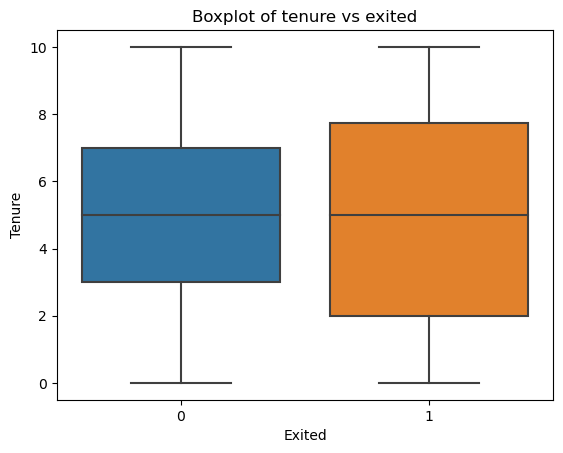

In [ ]:
sns.boxplot(x=churn["Exited"], y=churn["Tenure"])
plt.xlabel("Exited")
plt.ylabel("Tenure")
plt.title("Boxplot of tenure vs exited")
plt.show

possible interpretation:
1. Early exits, customers who have a tendency to terminate their services have it relatively early.
2. Stable retained customers: Customers who stayed might exhibit a trend of having longer tenure with min of 3 years .
Conclusion: This insight may suggest that early exits need attention and retention strategy to prevent them from leaving the service. We shoul do some customer behaviour analysis to see why customers quit so early, analyzing the root cause would help the bank to raise the issues. Also we can think of how we can keep our customers who hasnt exited yet but are on their early years engaged so they don't leave us

<function matplotlib.pyplot.show(close=None, block=None)>

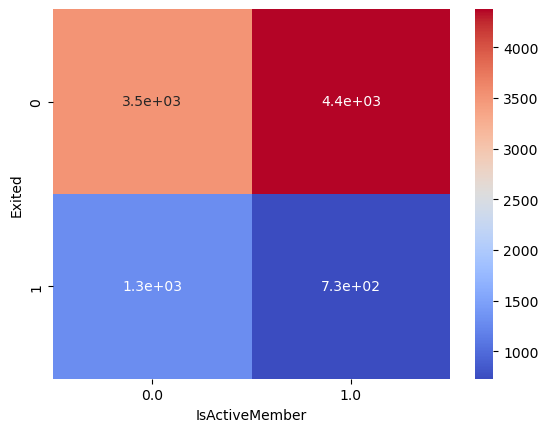

In [ ]:
# Exited vs IsActive
heatmap_data = pd.crosstab(churn["Exited"], churn["IsActiveMember"])
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm")
plt.show

The red secion shows the most important data with 4500 customers who are active and has not exited
The blue section shows the active members who exited and it is relatively low with value 740 customers 
The light blou section shows the exited customers who weren't active members. the orange section shows customers who are still customers but not active with 3500 customers.
Most category are among the not exited group which is expected. Outliers which has value in this range would change the mean and we should consider thise before deleting it.
It means people who are active would most likely to keep their account  than the other group. customers who haven't been exited yet but are not active can be targetted by marketing as they have reasonable value. so when considering outliers we should investigate to which group they belong if they belong to our unwanted target 

<Axes: xlabel='HasCrCard', ylabel='Exited'>

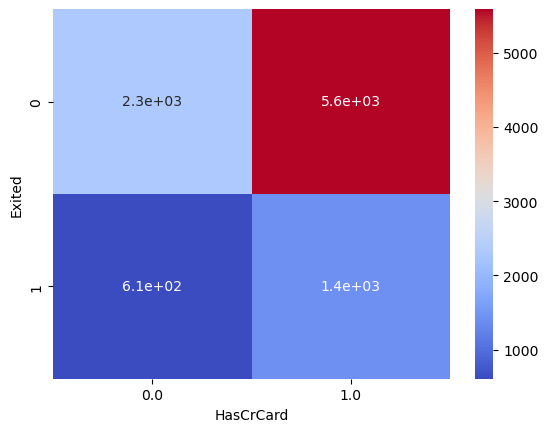

In [ ]:
# Exited Vs Cardowner
heatmap_data = pd.crosstab(churn["Exited"], churn['HasCrCard'])
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm")


In [ ]:
churn.T


,0,1,2,3,4,5,6,7,8,9,...,10036,10037,10038,10039,10040,10041,10042,10043,10044,10045
CustomerId,15565701,15565706,15565714,15565779,15565796,15565806,15565878,15565879,15565891,15565996,...,15815534,15815552,15815560,15815615,15815626,15815628,15815645,15815656,15815660,15815690
CreditScore,698.0,612.0,601.0,627.0,745.0,532.0,631.0,845.0,709.0,653.0,...,505.0,670.0,666.0,681.0,640.0,711.0,481.0,541.0,758.0,614.0
Geography,Spain,Spain,France,Germany,Germany,France,Spain,France,France,France,...,Spain,France,Germany,France,France,France,France,Germany,France,Spain
Gender,NaN,Male,Male,Female,Male,Male,Male,Female,Male,Male,...,NaN,Female,Male,Male,Male,Female,NaN,Female,Female,Female
Age,39.0,35.0,47.0,30.0,48.0,38.0,29.0,28.0,39.0,44.0,...,37.0,42.0,74.0,36.0,63.0,37.0,37.0,39.0,34.0,40.0
Tenure,9.0,1.0,1.0,6.0,10.0,9.0,3.0,9.0,8.0,NaN,...,NaN,6.0,7.0,5.0,2.0,8.0,8.0,9.0,1.0,3.0
Balance,161993.89,0.0,64430.06,57809.32,96048.55,0.0,0.0,0.0,0.0,0.0,...,134006.39,112333.63,105102.5,141952.07,68432.45,113899.92,152303.66,100116.67,154139.45,113348.5
NumOfProducts,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0
HasCrCard,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0
IsActiveMember,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0


Here we can see that our most important and desired seciton is the red one where cusotmers have card and havnt exited with 5700 the highest section
the second highest is the customers who havent exited but havent had cards yet with 2300 customers
the next segment is where customers with card exited counts to  1400.
then we have few number of customers who exited and didnt have card 610

Let's get the frequency table where we have exited, has card, tenure and ISActive


In [ ]:
bins = [0, 2, 4, 6, 8 , 11, float('inf')]
labels = ["0-2", "2-4", "4-6","6-8", "8-11", "11+"]
churn["Tenure_Category"] = pd.cut(churn["Tenure"], bins=bins, labels=labels, right = False)
Frequency_table =  churn.groupby(["Exited","IsActiveMember", "HasCrCard","Tenure_Category" ]).size().reset_index(name="Frequency")
Frequency_table



C:\Users\donna\AppData\Local\Temp\ipykernel_11744\3682782782.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,Exited,IsActiveMember,HasCrCard,Tenure_Category,Frequency
0,0,0.0,0.0,0-2,150
1,0,0.0,0.0,2-4,198
2,0,0.0,0.0,4-6,206
3,0,0.0,0.0,6-8,211
4,0,0.0,0.0,8-11,252
5,0,0.0,0.0,11+,0
6,0,0.0,1.0,0-2,302
7,0,0.0,1.0,2-4,500
8,0,0.0,1.0,4-6,500
9,0,0.0,1.0,6-8,503


In [ ]:
pivot_table = Frequency_table.pivot_table(index = ["Exited","IsActiveMember", "HasCrCard"], 
                                          columns= "Tenure_Category", values="Frequency", fill_value=0
                                            )
pivot_table["Sum"] = pivot_table.iloc[:,3:].sum(axis=1)
pivot_table.loc["Total"] = pivot_table.iloc[:,:].sum()
print(pivot_table)

Tenure_Category     0-2     2-4     4-6     6-8    8-11  11+     Sum
(0, 0.0, 0.0)     150.0   198.0   206.0   211.0   252.0  0.0   463.0
(0, 0.0, 1.0)     302.0   500.0   500.0   503.0   644.0  0.0  1147.0
(0, 1.0, 0.0)     217.0   269.0   246.0   242.0   289.0  0.0   531.0
(0, 1.0, 1.0)     425.0   640.0   596.0   623.0   758.0  0.0  1381.0
(1, 0.0, 0.0)      58.0    63.0    72.0    59.0   101.0  0.0   160.0
(1, 0.0, 1.0)     138.0   193.0   187.0   169.0   230.0  0.0   399.0
(1, 1.0, 0.0)      44.0    49.0    51.0    51.0    51.0  0.0   102.0
(1, 1.0, 1.0)      80.0   104.0    87.0    86.0   115.0  0.0   201.0
Total            1414.0  2016.0  1945.0  1944.0  2440.0  0.0  4384.0


Based on the above table we can see most of our customers are in group {hasn't't exited, is active and has credit card} and  hasnät exited, Is not active and Has card card. So we should treat these combinations when we are dealing with outliers and want to delete them.
most of our customers are in tenure 2-4 and 8-11 group so if someone is an outlier or nan value in credit score it is safe to normalize it to this group
and the least group is 0-2. We would expect that apparently customers  who exited, are not active are the least count.

In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status', 'outl_CreditScore',
       'outl_Age', 'outl_Tenure', 'outl_Balance', 'outl_NumOfProducts',
       'outl_EstimatedSalary', 'Tenure_Category'],
      dtype='object')

<Axes: xlabel='Exited', ylabel='Geography'>

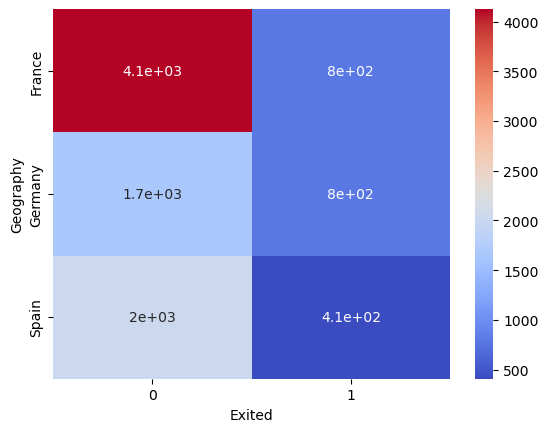

In [ ]:
# Country vs exited 
# Exited Vs Cardowner
heatmap_data = pd.crosstab(churn["Geography"], churn['Exited'])
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm")

We can see that spain has the least exited amount while germany compared to its number of customers 
has the most exited (we should consider that). France has the highest customer base and it's churn is approximately as spain and low while Germany has a high churn rate and the reason should be investigated.

Now these are the observations and applying the categorical and numerical outlier treatment first the obvious ones then go to clustering

In [ ]:
# replace all the negative values by NaNs : except for balance  (they probably can be negative as it has credit card product)
churn[churn['Age']<0 ] = np.nan
churn[churn['Tenure']<0 ] = np.nan
churn[churn['NumOfProducts']<0 ] = np.nan
churn[churn['EstimatedSalary']<0 ] = np.nan


In [ ]:
churn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10001 entries, 0 to 10045
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   CustomerId            10001 non-null  int64   
 1   CreditScore           9983 non-null   float64 
 2   Geography             9810 non-null   object  
 3   Gender                9727 non-null   object  
 4   Age                   9745 non-null   float64 
 5   Tenure                9921 non-null   float64 
 6   Balance               9851 non-null   float64 
 7   NumOfProducts         9711 non-null   float64 
 8   HasCrCard             9922 non-null   float64 
 9   IsActiveMember        9918 non-null   float64 
 10  EstimatedSalary       9958 non-null   float64 
 11  Exited                10001 non-null  int64   
 12  Credit_Score_status   9978 non-null   category
 13  outl_CreditScore      10001 non-null  int32   
 14  outl_Age              10001 non-null  int32   
 15  outl_Te

In [ ]:
churn[churn["NumOfProducts"]<0].count()

CustomerId              0
CreditScore             0
Geography               0
Gender                  0
Age                     0
Tenure                  0
Balance                 0
NumOfProducts           0
HasCrCard               0
IsActiveMember          0
EstimatedSalary         0
Exited                  0
Credit_Score_status     0
outl_CreditScore        0
outl_Age                0
outl_Tenure             0
outl_Balance            0
outl_NumOfProducts      0
outl_EstimatedSalary    0
Tenure_Category         0
dtype: int64

In [ ]:
churn[churn["Age"]<0].count()

CustomerId              0
CreditScore             0
Geography               0
Gender                  0
Age                     0
Tenure                  0
Balance                 0
NumOfProducts           0
HasCrCard               0
IsActiveMember          0
EstimatedSalary         0
Exited                  0
Credit_Score_status     0
outl_CreditScore        0
outl_Age                0
outl_Tenure             0
outl_Balance            0
outl_NumOfProducts      0
outl_EstimatedSalary    0
Tenure_Category         0
dtype: int64

In [ ]:
outlier_to_test_col = ['CreditScore','Age', 'Tenure', 'Balance', 'NumOfProducts','EstimatedSalary']
churn_outl_df = pd.DataFrame(
    {
        "outl_" + col: univariate_outliers(churn[col])
        for col in outlier_to_test_col
    }
)
(
    churn_outl_df
    .melt()
    .reset_index()
    .pivot_table(
        index="variable",
        columns="value",
        values="index",
        aggfunc="count",
        fill_value=0
    )
)

value,-1,0,1,2
variable,,,,
outl_Age,0,9649,340,12
outl_Balance,0,9999,0,2
outl_CreditScore,15,9984,0,2
outl_EstimatedSalary,0,10001,0,0
outl_NumOfProducts,0,9942,58,1
outl_Tenure,0,10001,0,0


In [ ]:
churn["Age"].isna

<bound method Series.isna of 0        39.0
1        35.0
2        47.0
3        30.0
4        48.0
         ... 
10041    37.0
10042    37.0
10043    39.0
10044    34.0
10045    40.0
Name: Age, Length: 10001, dtype: float64>

In [ ]:
# Let's investigate credit score
churn["Age"]


0        39.0
1        35.0
2        47.0
3        30.0
4        48.0
         ... 
10041    37.0
10042    37.0
10043    39.0
10044    34.0
10045    40.0
Name: Age, Length: 10001, dtype: float64

In [ ]:
Crd= churn

In [ ]:
Crd[["outl_CreditScore"]].sum()

outl_CreditScore   -11
dtype: int64

In [ ]:
# There are two extreme outliers that from the charts I would set their score to he upper bound max
churn["CreditScore"].nlargest(3)

6524    2924.008649
8482    2158.510025
91       850.000000
Name: CreditScore, dtype: float64

In [ ]:
# I would set these two to the next max
churn.iloc[91]

CustomerId               15568238
CreditScore                 650.0
Geography                   Spain
Gender                       Male
Age                          20.0
Tenure                        8.0
Balance                       0.0
NumOfProducts                 2.0
HasCrCard                     1.0
IsActiveMember                1.0
EstimatedSalary         113469.65
Exited                          0
Credit_Score_status        medium
outl_CreditScore                0
outl_Age                        0
outl_Tenure                     0
outl_Balance                    0
outl_NumOfProducts              0
outl_EstimatedSalary            0
Tenure_Category              8-11
Name: 92, dtype: object

Based on data it is good to keep these two people. Going to make his credit score as the next nlargest number.



In [ ]:
#churn[churn["CreditScore"] == 2924.008649] = 850


In [ ]:
churn["CreditScore"].nlargest(3)

6524    2924.008649
8482    2158.510025
91       850.000000
Name: CreditScore, dtype: float64

In [ ]:
churn.at[6524,"CreditScore"] = 850
churn.at[8482,"CreditScore"] = 850


In [ ]:
churn.sort_values(by="CreditScore", ascending=False)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,Tenure_Category
5423,15700801,850.0,Germany,Male,42.0,6.0,84445.68,3.0,0.0,1.0,60021.34,1,high,0,0,0,0,0,0,6-8
168,15570004,850.0,France,Male,31.0,3.0,0.00,2.0,1.0,0.0,121866.87,0,high,0,0,0,0,0,0,2-4
9889,15811958,850.0,Germany,Male,44.0,2.0,112755.34,2.0,0.0,0.0,158171.36,0,high,0,0,0,0,0,0,2-4
9033,15790744,850.0,France,Female,34.0,9.0,92899.27,2.0,1.0,0.0,97465.89,0,high,0,0,0,0,0,0,8-11
9888,15811947,850.0,France,Male,33.0,0.0,124781.67,1.0,0.0,1.0,33700.52,0,high,0,0,0,0,0,0,0-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8848,15785815,NaN,Germany,Male,NaN,1.0,142631.54,2.0,1.0,1.0,175894.24,0,NaN,0,0,0,0,0,0,0-2
8950,15788556,NaN,France,Female,42.0,4.0,148283.94,1.0,1.0,1.0,44692.63,1,NaN,0,0,0,0,0,0,4-6
9317,15797293,NaN,France,Female,25.0,3.0,0.00,2.0,1.0,0.0,179608.96,0,NaN,0,0,0,0,0,0,2-4
9440,15800482,NaN,Spain,Female,33.0,7.0,0.00,2.0,1.0,1.0,168261.40,0,NaN,0,0,0,0,0,0,6-8


In [ ]:
churn.columns

Index(['CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure',
       'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited', 'Credit_Score_status', 'outl_CreditScore',
       'outl_Age', 'outl_Tenure', 'outl_Balance', 'outl_NumOfProducts',
       'outl_EstimatedSalary', 'Tenure_Category'],
      dtype='object')

Geography

In [ ]:
churn["Geography"].unique()

array(['Spain', 'France', 'Germany', nan], dtype=object)

In [ ]:
na_count = churn["Geography"].isna().sum()
print(na_count)

191


In [ ]:
geo = churn.loc[churn["Geography"].isnull()] 
geo.head(20)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,Tenure_Category
32,15566660,670.0,NaN,Female,41.0,10.0,0.00,3.0,1.0,0.0,81602.02,0,medium,0,0,0,0,0,0,8-11
56,15567422,630.0,NaN,Male,42.0,6.0,0.00,2.0,1.0,0.0,162697.93,0,medium,0,0,0,0,0,0,6-8
271,15572626,620.0,NaN,Male,44.0,8.0,0.00,2.0,1.0,1.0,15627.51,0,medium,0,0,0,0,0,0,8-11
283,15573045,547.0,NaN,Male,62.0,10.0,127738.75,2.0,1.0,1.0,85153.00,0,low,0,0,0,0,0,0,8-11
375,15575492,828.0,NaN,Female,41.0,7.0,0.00,2.0,1.0,0.0,171378.77,0,high,0,0,0,0,0,0,6-8
400,15576124,582.0,NaN,Male,41.0,1.0,40488.76,1.0,1.0,0.0,128528.83,0,low,0,0,0,0,0,0,0-2
423,15576641,733.0,NaN,Male,40.0,5.0,125725.02,2.0,1.0,1.0,50783.10,0,high,0,0,0,0,0,0,4-6
614,15581733,781.0,NaN,Female,28.0,4.0,0.00,2.0,NaN,0.0,177703.15,0,high,0,0,0,0,0,0,4-6
641,15582616,520.0,NaN,Female,38.0,4.0,0.00,2.0,1.0,0.0,56388.63,0,low,0,0,0,0,0,0,4-6
787,15586029,806.0,NaN,Male,34.0,2.0,96152.68,2.0,1.0,0.0,143711.02,0,high,0,0,0,0,0,0,2-4


Age: it has - values that I made them nan. Let's see the outliers

In [ ]:
# I deleted all the negative values before let's check for age
churn.loc[churn["Age"] <0]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,Tenure_Category


Gender: Let's see the nans ,

In [ ]:
gender = churn.loc[churn["Gender"].isnull()] 
geo.head(20)

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,Tenure_Category
32,15566660,670.0,NaN,Female,41.0,10.0,0.00,3.0,1.0,0.0,81602.02,0,medium,0,0,0,0,0,0,8-11
56,15567422,630.0,NaN,Male,42.0,6.0,0.00,2.0,1.0,0.0,162697.93,0,medium,0,0,0,0,0,0,6-8
271,15572626,620.0,NaN,Male,44.0,8.0,0.00,2.0,1.0,1.0,15627.51,0,medium,0,0,0,0,0,0,8-11
283,15573045,547.0,NaN,Male,62.0,10.0,127738.75,2.0,1.0,1.0,85153.00,0,low,0,0,0,0,0,0,8-11
375,15575492,828.0,NaN,Female,41.0,7.0,0.00,2.0,1.0,0.0,171378.77,0,high,0,0,0,0,0,0,6-8
400,15576124,582.0,NaN,Male,41.0,1.0,40488.76,1.0,1.0,0.0,128528.83,0,low,0,0,0,0,0,0,0-2
423,15576641,733.0,NaN,Male,40.0,5.0,125725.02,2.0,1.0,1.0,50783.10,0,high,0,0,0,0,0,0,4-6
614,15581733,781.0,NaN,Female,28.0,4.0,0.00,2.0,NaN,0.0,177703.15,0,high,0,0,0,0,0,0,4-6
641,15582616,520.0,NaN,Female,38.0,4.0,0.00,2.0,1.0,0.0,56388.63,0,low,0,0,0,0,0,0,4-6
787,15586029,806.0,NaN,Male,34.0,2.0,96152.68,2.0,1.0,0.0,143711.02,0,high,0,0,0,0,0,0,2-4


In [ ]:
na_count2 = churn["Gender"].isna().sum()
print(na_count2)

274


we can consider 80+ as outlier as there are few points there but will dive in clustering

Let's see the balance:
we have two outliers that we should look into them later after clustering

NumOfProducts
I made the negative numbers to Nan
we have one strange outlier whose number of products is 11.4. We should deal with it in outliers

Tenure: let's summarize Tenure
We had some negative points that I made them nans
We had two extreme outliers tenure >30 I deleted them
Our tenure is now bounded between 1 and 10
most of the customers are customers for more than 2 

Estimated Salary has one extremely low salary of 11.58 is weird and should be outlier or set to min. Let's look into it after categorization.

In [ ]:
churn.loc[churn["EstimatedSalary"] ==11.58]

,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Credit_Score_status,outl_CreditScore,outl_Age,outl_Tenure,outl_Balance,outl_NumOfProducts,outl_EstimatedSalary,Tenure_Category
9048,15791053,709.0,Germany,Male,45.0,4.0,122917.71,1.0,1.0,1.0,11.58,1,high,0,0,0,0,0,0,4-6


He exited and everything is normal and even his credit score in high.

So now the duplicates based on customer ID are deleted and all the filling of missing values copying from one data point to the other similar data point with missing value is done . I am going to save the file.


Now let's do the next section. Clustering!

In [ ]:
outl_columns = [ "CreditScore", "Age","Tenure", "Balance", "NumOfProducts", "EstimatedSalary"]
churn[outl_columns]

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary
0,698.0,39.0,9.0,161993.89,1.0,90212.38
1,612.0,35.0,1.0,0.00,1.0,83256.26
2,601.0,47.0,1.0,64430.06,2.0,96517.97
3,627.0,30.0,6.0,57809.32,1.0,188258.49
4,745.0,48.0,10.0,96048.55,1.0,74510.65
...,...,...,...,...,...,...
10041,711.0,37.0,8.0,113899.92,1.0,80215.20
10042,481.0,37.0,8.0,152303.66,2.0,175082.20
10043,541.0,39.0,9.0,100116.67,1.0,199808.10
10044,758.0,34.0,1.0,154139.45,1.0,60728.89


In [ ]:
churn.to_csv("Churn_With some outliers.csv", index=False)